<a href="https://colab.research.google.com/github/cfoli/AI-4-Financial-Modeling/blob/main/neural_analysis_base_old_speech_paradigm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [80]:
# Load matlab-saved neural signals
def load_matfile(matfile_dir,brain_area,task):
    """
    Loads neural signal data from a MATLAB `.mat` file and returns a pandas DataFrame
    containing the reshaped neural signals along with metadata such as electrode,
    time, trial, and task-specific labels.

    Parameters:
        matfile_dir (str):
            Path to the `.mat` file containing neural data and associated labels.
        brain_area (str):
            Name of the brain area (e.g., "M1", "S1") to determine the variable key in the `.mat` file.
        task (str):
            Task type for which data is being loaded. Options are:
            - "cl_grasping": Includes labels for grasp type and hand action (open/close).
            - "speech": Includes labels for overt or covert speech.
            - "concurrent": Includes labels for both motor and speech tasks.

    Returns:
        pandas.DataFrame:
            A DataFrame containing the following columns:
            - "Signal": Neural signals reshaped from the original 3D tensor.
            - "Electrode": Electrode index for each signal.
            - "Time": Time index within each trial.
            - "Trial": Trial index for each signal.
            - Additional task-specific columns, depending on the provided `task`:
                - "graspType" (e.g., "power", "pinch")
                - "handOpenOrClose" (e.g., "opening", "closing")
                - "overtOrcovert" (e.g., "overt", "covert")

    Notes:
        - Assumes the `.mat` file contains variables named according to specific
          conventions (e.g., "trialmat<brain_area>", and task-specific labels).
        - If a required variable is not found in the `.mat` file, the function will print a warning.

    Example:
        neural_df = load_matfile("path/to/file.mat", "M1", "cl_grasping")

    Date: Dec 04.24.W [CXF & The AI Assistant]
    """
    neuralDataFrame = []
    # package/neural_analysis.py
    import h5py
    import pandas as pd
    import numpy as np

    data_var   = f"trialmat{brain_area.lower()}"
    # trial_labels_var = "trial_labels"

    if task == "cl_grasping":
        # trial_label_types = ["graspType","kinematicDirection"]
        trial_label_types = ["graspType","handOpenOrClose"]
    elif task == "speech":
        trial_label_types = ["overtOrcovert"]
    elif task == "concurrent":
        trial_label_types = ["graspType","handOpenOrClose","overtOrcovert"]

    with h5py.File(matfile_dir, 'r') as mat_file:
        # List all top-level keys (variables)
        vars_ = list(mat_file.keys())
        # mat_file
        # Access a specific variable (replace 'variable_name' with the actual name)

        if data_var in vars_:
            # Read the dataset into a NumPy array
            data   = mat_file[data_var][()] # R x T x nCh
            # labels = mat_file[trial_labels_var][()]

            r,t,n = data.shape


            flattened_c = []
            for ch in range(data.shape[2]):  # For every channel
                for tr in range(data.shape[0]):  # For every trial
                    flattened_c.append(np.squeeze(data[tr, :, ch])) # n*r x t

            data_reshaped = np.hstack(flattened_c) # n*r*t x 1

            # Create DataFrame from the reshaped tensor
            neuralDataFrame = pd.DataFrame(data_reshaped, columns=["Signal"])

            neuralDataFrame['Electrode']   = np.repeat(np.arange(1,n+1), r * t)
            neuralDataFrame['Time']        = np.tile(np.arange(t), r * n)
            neuralDataFrame['Trial']       = np.tile(np.repeat(np.arange(1,r+1), t), n)

            # loop through the different trial label types for current task type
            for label_type in trial_label_types:
                if label_type in mat_file:  # if the current label type exists in the loaded matlab file,
                    labels_ = mat_file[label_type][()] # task labels

                    # convert task labels array (most likely 1s & 2s) to string array
                    if label_type == "handOpenOrClose":
                        labels_string = np.where(labels_ == 0, "opening", "closing") # convert 1s to "opening" and 2s to "closing"
                    elif label_type == "graspType":
                        labels_string = np.where(labels_ == 1, "power", "pinch") # convert 1s to "power" and 2s to "pinch"
                    elif label_type == "overtOrcovert":
                        labels_string = np.where(labels_ == 0, "overt", "covert") # convert 1s to "overt" and 2s to "covert"

                    neuralDataFrame[label_type] = np.tile(np.repeat(labels_string, t), n) # add this label type as a new column in the data frame

        else:
            print(f"Variable {data_var} not found in the file.")

        return neuralDataFrame

# Add vertical bars at specified x locations
def add_vertical_lines(x_values, colors=None, linestyles=None, labels=None, linewidths=None, alphas=None, **kwargs):
    """
    Adds vertical lines to a plot with customizable attributes.

    Parameters:
        x_values (list):             List of x-coordinates where vertical lines should be drawn.
        colors (list, optional):     List of colors for each line. Default is 'b' for all lines.
        linestyles (list, optional): List of linestyles for each line. Default is '--' for all lines.
        labels (list, optional):     List of labels for each line. Default is None.
        linewidths (list, optional): List of linewidths for each line. Default is 1 for all lines.
        alphas (list, optional):     List of opacities for each line. Default is 0.7 for all lines.

        **kwargs: Additional keyword arguments to pass to `plt.axvline`.

    Date: Nov 27.24.W [CXF & The AI Assistant]
    """
    # Ensure all optional parameters have default lists if not provided

    import matplotlib.pyplot as plt

    num_lines  = len(x_values)
    colors     = colors or ['b'] * num_lines
    linestyles = linestyles or ['--'] * num_lines
    labels     = labels or [None] * num_lines
    linewidths = linewidths or [1] * num_lines
    alphas     = alphas or [0.7] * num_lines

    for i, x in enumerate(x_values):
        plt.axvline(
            x         = x,
            # color     = colors[i] if i < len(colors) else 'b',
            # linestyle = linestyles[i] if i < len(linestyles) else '--',
            # label     = labels[i] if labels and i < len(labels) else None,
            # linewidth = linewidths[i] if i < len(linewidths) else 1,
            # alpha     = alphas[i] if i < len(alphas) else 0.7,
            color=colors[i] if i < len(colors) else kwargs.get('color', 'b'),
            linestyle=linestyles[i] if i < len(linestyles) else kwargs.get('linestyle', '--'),
            linewidth=linewidths[i] if i < len(linewidths) else kwargs.get('linewidth', 1),
            label=labels[i] if i < len(labels) else kwargs.get('label', None),
            alpha=alphas[i] if i < len(alphas) else kwargs.get('alpha', 0.7)
            **kwargs
        )

def plot_spike_panel(data_to_plot,brain_area, task, trial_label_type, compute_ci_TF = True, show_plot = True):
    """
    Plots a panel of spike activity or neural signals for multiple electrodes using Seaborn's FacetGrid,
    grouped by a specified trial label type. This function is useful for visualizing activity across
    multiple conditions and trials.

    Parameters:
        data_to_plot (pandas.DataFrame):
            The DataFrame containing neural data to plot. It should include the following columns:
            - "Electrode": Electrode index for grouping subplots.
            - "Time": Time indices for the signals.
            - "Signal": Neural activity values (e.g., z-scored firing rates).
            - Columns corresponding to `trial_label_type`.
        brain_area (str):
            Name of the brain area being visualized (e.g., "M1", "S1").
        task (str):
            Name of the task (e.g., "speech", "cl_grasping").
        trial_label_type (str):
            The column in the DataFrame used for grouping signals into conditions.
            Options include:
            - "overtOrcovert" (e.g., speech task conditions)
            - "handOpenOrClose" (e.g., motor task conditions)
            - "graspType" (e.g., motor grasp types)

    Behavior:
        - Sets different color palettes for motor and speech-related conditions based on `trial_label_type`.
        - Creates a grid of subplots, one for each electrode, sharing x- and y-axes where applicable.
        - Plots neural signals with line plots, with error bands representing 95% confidence intervals.
        - Adds vertical lines to all subplots at specified x-coordinates for visualizing task-related cues.
        - Customizes aesthetics, including axis colors, tick properties, and legends.

    Returns:
        None. Displays the plot.

    Example:
        plot_spike_panel(data_to_plot=df,
                         brain_area="M1",
                         task="speech",
                         trial_label_type="overtOrcovert")

    Date: Dec 05.24.Th [CXF & The AI Assistant]

    """
    import seaborn as sns
    import matplotlib.pyplot as plt
    # import numpy as np

    # set plot colors
    trial_groups = data_to_plot[trial_label_type].unique()

    if trial_label_type in ["overtOrcovert"]:
        axis_color = 'r'
        c = ["#F9B900","#FF704F"] # speech
        palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}

    elif trial_label_type in ["handOpenOrClose", "graspType"]:
        axis_color = 'b'
        c = ["#FF43D7","#9300D7"] # motor
        palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}


    plt.figure(dpi=750)
    g = sns.FacetGrid(data_to_plot, col="Electrode",col_wrap=11, height=3, sharex=True, sharey=True,
                    hue=trial_label_type, palette = palette_dict)  # palettes: brg, plasma, inferno, nipy_spectral

    error_params = ('ci', 95) if compute_ci_TF else None
    # Add lineplots to each subplot, grouping by a binary label (e.g., handOpenOrClose)
    g.map_dataframe(sns.lineplot, x="Time", y="Signal", linewidth = 2,
                    # errorbar=None,
                errorbar=error_params, err_kws={'lw': 0}, n_boot=50, err_style='band')

    # remove x and y axis lines ("spines") on all subplots
    g.despine(bottom = True, left = True)

    # set both x and y tick properties (length, width, on/off, color etc)
    g.tick_params(axis = 'both', length = 3, width = 1, colors = axis_color, labelsize = 14,
                bottom = False, labelbottom = False)

    # Map the vertical line function to each subplot
    g.map(add_vertical_lines,
        x_values   = [750, 2250],
        colors     = ['blue', 'green'],
        linestyles = ['--', '-'],
        labels     = ['Target Cue', 'Go Cue'],
        linewidths = [1, 1],
        alphas     = [0.5, 0.9]
    )

    g.fig.suptitle(f"Area = {brain_area} | Task = {task} | Conditions = {trial_label_type}", fontsize=40, y=1.02)

    plt.grid(False)
    g.add_legend(title=trial_label_type)
    g.set_axis_labels(x_var = "Time", y_var = "SBP (z-score)", fontsize = 20, labelpad = 20)
    plt.tight_layout()
    if show_plot: plt.show()

def plot_example_channel(data_to_plot,channel_num,brain_area, task, trial_label_type):
    """
    Plots the neural activity or signal from a specific electrode channel for a given task,
    grouped by trial labels, with vertical lines indicating task-related events.

    Parameters:
        data_to_plot (pandas.DataFrame):
            The DataFrame containing neural data to plot. It should include the following columns:
            - "Electrode": Electrode index for identifying channels.
            - "Time": Time indices for the signals.
            - "Signal": Neural activity values (e.g., z-scored firing rates).
            - Columns corresponding to `trial_label_type`.
        channel_num (int):
            The specific electrode channel number to plot.
        brain_area (str):
            Name of the brain area being visualized (e.g., "M1", "S1").
        task (str):
            Name of the task (e.g., "speech", "cl_grasping").
        trial_label_type (str):
            The column in the DataFrame used for grouping signals into conditions.
            Options include:
            - "overtOrcovert" (e.g., speech task conditions)
            - "handOpenOrClose" (e.g., motor task conditions)
            - "graspType" (e.g., motor grasp types)

    Behavior:
        - Filters the data to only include the specified `channel_num`.
        - Sets different color palettes for motor and speech-related conditions based on `trial_label_type`.
        - Plots the neural signal with error bands (95% confidence intervals).
        - Adds vertical lines at specific x-coordinates for visualizing task-related cues.
        - Customizes plot aesthetics, including axis labels, colors, and tick properties.

    Returns:
        None. Displays the plot.

    Example:
        plot_example_channel(data_to_plot=df,
                             channel_num=3,
                             brain_area="M1",
                             task="speech",
                             trial_label_type="overtOrcovert")

    Date: Dec 05.24.Th [CXF & The AI Assistant]

    """

    import seaborn as sns
    import matplotlib.pyplot as plt
    # import numpy as np

    # set plot colors
    trial_groups = data_to_plot[trial_label_type].unique()

    # if trial_label_type in ["overtOrcovert"]:
    #     axis_color = 'r'
    #     c = ["#F9B900","#FF704F"] # speech
    #     palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}

    # elif trial_label_type in ["handOpenOrClose", "graspType"]:
    #     axis_color = 'b'
    #     c = ["#FF43D7","#9300D7"] # motor
    #     palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}
    if task == "speech":
        axis_color = 'r'
        c = ["#F9B900","#FF704F"] # speech
        palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}

    elif task == "cl_grasping":
        axis_color = 'b'
        c = ["#FF43D7","#9300D7"] # motor
        palette_dict = {f"{group}": c[i] for i,group in enumerate(trial_groups)}


    data_to_plot = data_to_plot[data_to_plot["Electrode"] == channel_num].copy()

    plt.figure(figsize = (11, 8), dpi=750)

    line_ = sns.lineplot(data = data_to_plot,
                x = "Time", y = "Signal", hue = trial_label_type,
                palette   = palette_dict, linewidth = 8, # palettes: brg, plasma, inferno, nipy_spectral
                errorbar  = ('ci', 95), err_kws={'lw': 0}, n_boot=50, err_style='band')

    # Turn off specific spines
    # line_.spines[['right','bottom']].set_visible(False)  # Turn off specified spines

    line_.spines[:].set_visible(False) # Turn off all spines

    # Plot vertical line bars at cue and go
    add_vertical_lines(
        x_values   = [750, 2250],
        colors     = ['blue', 'green'],
        linestyles = ['--', '-'],
        labels     = ['Target Cue', 'Go Cue'],
        linewidths = [5, 5],
        alphas     = [0.25, 0.25])

    # # set both x and y tick properties (length, width, on/off, color etc)
    line_.tick_params(axis = 'both', direction = "out", length = 6, width = 2, colors = axis_color, labelsize = 28,
                bottom = False, labelbottom = False)

    # line_.set_ylim(ymin=-.5, ymax=3)

    # Set the specified x-tick positions and new labels
    # line_.set_xticks([750, 2250])
    # line_.set_xticklabels(["-1.5","0"])

    plt.grid(False)
    plt.title(f"Ch {channel_num} | {brain_area} | {task} | {trial_label_type}", fontsize=30, pad=40)
    plt.xlabel('Time from trial onset (ms)', fontsize=30, labelpad=10)
    plt.ylabel('Z-scored voltage', fontsize=30, labelpad=20)
    plt.xlabel("Time (sec)", fontsize = 30,  c = axis_color, labelpad = 30)
    plt.ylabel("SBP (z-score)", fontsize = 30, c = axis_color, labelpad = 20)
    plt.legend(title = f"{trial_label_type}", bbox_to_anchor = (1.05, 1), loc = 'upper left')
    plt.tight_layout()
    plt.show()

def run_pca_and_plot_scatter(input_data, trial_labels, trial_label_type, title_params, plot_kde_TF = False):
    """
    Perform PCA on mean_array and plot using seaborn.

    Parameters:
        input_data : (N x R) Array of mean signals (electrodes x trials) or Data frame for multiple stats
        trial_labels (1 x R): Labels for trials.
        trial_label_type (str): Label type for the plot legend.

    Returns:
        None: Displays a scatter plot.
    Date: Dec 7.24.M
    """
    # Perform PCA

    import pandas as pd
    import numpy as np
    from   sklearn.decomposition import PCA
    import matplotlib.pyplot as plt
    import seaborn as sns
    from   matplotlib.colors import rgb2hex

    # Generate color palette
    labels_        = np.unique(trial_labels)

    axis_color = 'r'
    c = ["#EACE29","#FF7B00"] # speech
    palette_dict = {f"{group}": c[i] for i,group in enumerate(labels_)}
    if title_params['task'] == "speech":
        axis_color = 'r'
        # c = ["#F9B900","#FF704F"] # speech
        c = ["#EACE29","#FF7B00"] # speech
        palette_dict = {f"{group}": c[i] for i,group in enumerate(labels_)}

    elif title_params['task'] == "cl_grasping":
        axis_color = 'b'
        c = ["#FF43D7","#9300D7"] # motor
        palette_dict = {f"{group}": c[i] for i,group in enumerate(labels_)}

    if isinstance(input_data, np.ndarray):
        pca = PCA(n_components=2)
        mean_array = input_data.copy()
        pca_results = pca.fit_transform(mean_array.T)

        # Create a DataFrame for PCA results
        pca_df = pd.DataFrame({
            'PC1': pca_results[:, 0],
            'PC2': pca_results[:, 1],
            trial_label_type: trial_labels
        })

        plt.figure(figsize=(12, 10), dpi=750)

        if plot_kde_TF:
            scatter_ = sns.jointplot(
            data=pca_df,
            x='PC1', y='PC2',
            height=12,
            hue=trial_label_type,
            kind="scatter",
            palette=palette_dict,
            alpha=0.9,
            edgecolor="white",
            s=400,
            markers  = ['h','h'])
        else:
            scatter_ = sns.scatterplot(
            data=pca_df,
            x='PC1', y='PC2',
            hue=trial_label_type,
            style = trial_label_type,
            palette=palette_dict,
            alpha=0.9,
            edgecolor="white",
            s=400,
            markers  = ['h','h']
            )

            # spines
            scatter_.spines[['top','right','bottom']].set_visible(False)  # Turn off specified spines
            scatter_.spines['left'].set_edgecolor(axis_color)  # modify spine color
            scatter_.spines['left'].set_linewidth(1) # modify spine thickness

            # ticks
            scatter_.tick_params(axis = 'both', direction = "out", length = 6, width = 2, colors = axis_color, labelsize = 25,
                        bottom = True, labelbottom = True)
        # axis labels
        plt.xlabel("PC 1", fontsize = 25,  c = axis_color, labelpad = 30)
        plt.ylabel("PC 2", fontsize = 25, c = axis_color, labelpad = 20)
        plt.title(f"{title_params['brain_area']} | {title_params['task']} | {title_params['label_type'] }  | {title_params['stat'] }", pad=25, fontsize=30)

        plt.legend(title = trial_label_type,   fontsize = 14, title_fontsize = 17)
        plt.grid(False)
        plt.tight_layout()

    elif isinstance(input_data, dict):
        import math
        plt.figure(figsize=(12, 10), dpi=750)

        # Determine subplot grid dimensions
        k = math.ceil(math.sqrt(len(input_data.keys())))

        # Create subplots for each variable (chans or latents)
        _, axes = plt.subplots(k, k, figsize=(12, 12), sharex=False, sharey=False, gridspec_kw={'hspace': 0.4, 'wspace': 0.4})
        axes = axes.flatten()

        label_encoder = {}
        for i,l in enumerate(labels_):
            label_encoder[l] = i

        scatter_groups = np.vectorize(label_encoder.get)(trial_labels)

        for i,key in enumerate(input_data.keys()):
            pca = PCA(n_components=2)
            mean_array  = input_data[key]
            pca_results = pca.fit_transform(mean_array.T)

            x  = pca_results[:, 0]
            y  = pca_results[:, 1]

            ax = axes[i]
            ax.scatter(x, y, c=scatter_groups, alpha=0.9, edgecolor="white",
            s=200)
            ax.set_xticks([])
            ax.set_yticks([])

            # Remove spines
            ax.spines[:].set_visible(False)

            # axis labels
            ax.set_xlabel("PC 1", fontsize = 10, c = axis_color, labelpad = 30)
            ax.set_ylabel("PC 2", fontsize = 10, c = axis_color, labelpad = 20)
            ax.set_title(f"{key}", pad=25, fontsize=17)


        for j in range(len(input_data.keys()), len(axes)):
            axes[j].axis("off")

        plt.suptitle(f"{title_params['brain_area']} | {title_params['task']} | {title_params['label_type'] }", y=1.02, fontsize=30)
        plt.legend(title = trial_label_type,   fontsize = 7, title_fontsize = 10)
        # plt.grid(False)
        plt.tight_layout()
        # plt.tight_layout(pad=1.0, h_pad=0.5, w_pad=0.5)


    plt.show()
    # return pca_df

def compute_neural_tuning(mean_array, trial_labels, p_value_threshold=0.05):
    """
    Analyze neural tuning using ANOVA.

    Parameters:
        mean_array (numpy.ndarray): NxR array of neural signals for N electrodes across R trials.
        trial_labels (numpy.ndarray): 1xR array of trial labels.
        p_value_threshold (float): Significance threshold for ANOVA.

    Returns:
        pd.DataFrame: DataFrame containing tuned electrode IDs and fraction of variance accounted.
        numpy.ndarray: Updated neural signals array for tuned electrodes only.

    Date: Dec 10.24.T
    """
    from sklearn.decomposition import PCA
    from scipy.stats import f_oneway
    import numpy as np
    import pandas as pd

    N, R = mean_array.shape
    tuned_electrodes = []
    idxs_of_tuned_electrodes = []
    variance_accounted_for = []

    for electrode in range(N):
        groups = [mean_array[electrode, trial_labels == label].copy() for label in np.unique(trial_labels)]
        anova_result = f_oneway(*groups)
        if anova_result.pvalue < p_value_threshold:
            tuned_electrodes.append(electrode+1)
            idxs_of_tuned_electrodes.append(electrode)

            # Calculate fraction of variance accounted
            total_var = np.var(mean_array[electrode, :])
            explained_var = np.var([np.mean(group) for group in groups])
            variance_accounted_for.append(100*(explained_var / total_var))

    # Filter neural signals for tuned electrodes
    mean_array_tuned_electrodes_only = mean_array[idxs_of_tuned_electrodes, :].copy()

    # Create a DataFrame for the results
    electrode_tuning_summary = pd.DataFrame({
        'Electrode': tuned_electrodes,
        'Electrode_index': idxs_of_tuned_electrodes,
        'Variance_Accounted_For': variance_accounted_for
    })

    return electrode_tuning_summary, mean_array_tuned_electrodes_only

def plot_tuning_heatmap(electrode_tuning_summary, title_params, vaf_field='Variance_Accounted_For', location_field='Electrode', scale_by_size_TF = False):
    """
    Generate an 8x8 scatter plot of electrode FVAF intensities with enhanced marker size for specified electrodes.

    Parameters:
        dataframe (pd.DataFrame): DataFrame with FVAF intensity values and electrode locations.
        vaf_field (str): Column name in the DataFrame for FVAF intensity values.
        location_field (str): Column name in the DataFrame for electrode locations (1-64).

    Returns:
        None: Displays the scatter plot.

    Date: Dec 10.24.T
    """
    import numpy as np
    import matplotlib.pyplot as plt

    if title_params['task'] == "cl_grasping": color_palette = "Purples"
    elif title_params['task'] == "speech": color_palette = "Reds" # Oranges, Reds

    grid_size = 8
    all_locations = np.arange(1, grid_size**2 + 1).reshape(grid_size, grid_size)

    # Extract FVAF values and electrode locations
    idxs_of_tuned_electrodes   = electrode_tuning_summary[location_field].values.copy()
    vaf_values = electrode_tuning_summary[vaf_field].values.copy()

    # Create a color map for the FVAF values
    norm = plt.Normalize(vmin=np.min(vaf_values), vmax=np.max(vaf_values))
    cmap = plt.cm.get_cmap(color_palette)


    plt.figure(figsize=(10, 8), dpi=750)
    ax = plt.gca()  # Get the current axes


    if scale_by_size_TF:
        # scale dots by FVAF
        for loc in all_locations.flatten():
            row, col = divmod(loc - 1, grid_size)
            if loc in idxs_of_tuned_electrodes:
                idx = np.where(idxs_of_tuned_electrodes == loc)[0][0]
                ax.scatter(col + 1, row + 1, s=norm(vaf_values[idx])*1250+250, c=[cmap(norm(vaf_values[idx]))], edgecolor='#D9D9D9', marker='o', label=None, linewidths=2)
            else:
                ax.scatter(col + 1, row + 1, s=30, c='gray', edgecolor='#D9D9D9', marker='+', alpha=0.4)
    else:
        for loc in all_locations.flatten():
            row, col = divmod(loc - 1, grid_size)
            if loc in idxs_of_tuned_electrodes:
                idx = np.where(idxs_of_tuned_electrodes == loc)[0][0]
                ax.scatter(col + 1, row + 1, s=1500, c=[cmap(norm(vaf_values[idx]))], edgecolor='#D9D9D9', marker='o', label=None, linewidths=2)
            else:
                ax.scatter(col + 1, row + 1, s=30, c='gray', edgecolor='#D9D9D9', marker='+', alpha=0.4)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_title(f"{title_params['brain_area']} | {title_params['task']} | {title_params['label_type']} | N = {len(idxs_of_tuned_electrodes)}", pad=20, fontsize=20)  # Increased font size for the title
    ax.invert_yaxis()

    # Add a colorbar to the current axes
    sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    sm.set_array([])  # Required for colorbar
    cbar = plt.colorbar(sm, ax=ax, label='VAF', shrink=0.8)
    cbar.ax.yaxis.label.set_size(15)  # Set the fontsize of the colorbar label
    cbar.ax.tick_params(width=0.5)    # Decrease the colorbar width

    import matplotlib.ticker as mtick
    ax.yaxis.set_major_formatter(mtick.PercentFormatter())  # Set y-axis format to percentage

    plt.show()

def fit_neural_decoder(X_train, y_train, model_='svm', random_state=42, optimize_hyperparameters = False, verbose = 0):
    """
    Train a binary classification model to predict grasp type based on neural signals.

    Parameters:
    X_train (numpy.ndarray or pandas.DataFrame): Feature matrix containing neural signals.
    y_train (numpy.ndarray or pandas.Series): Binary target vector (0 or 1).
    model_ (str): Name of the model to train. Options include:
        ['LogisticRegression', 'RandomForest', 'SVM', 'KNN', 'DecisionTree',
         'GradientBoosting', 'XGBoost', 'LightGBM', 'MLP'].
    test_size (float): Proportion of the dataset to include in the test split.
    random_state (int): Random seed for reproducibility.

    Returns:
    dict: A dictionary containing the trained model, test metrics, and predictions.

    Date: 12.11.2024.W
    Authors: CXF & the AI Assistant
    """

    from sklearn.linear_model import LogisticRegression
    from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.svm import SVC
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.naive_bayes import GaussianNB
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    from sklearn.model_selection import GridSearchCV
    from sklearn.model_selection import train_test_split


    # # Split the data
    # X_train, X_test, y_train, y_test = train_test_split(
    #     X, y, test_size=test_size, random_state=random_state
    # )

    # Initialize model and hyperparameter grid
    model = None
    param_grid = None

    # Define models and hyperparameter grids
    if model_ == 'logistic_regression':
        model = LogisticRegression(max_iter=1000, random_state=42)
        if optimize_hyperparameters:
            param_grid = {
                'C': [0.001, 0.01, 0.1, 1, 10, 100],
                'solver': ['liblinear', 'lbfgs', 'sag'],
                'penalty': ['l1', 'l2', 'elasticnet']
            }

    elif model_ == 'random_forest':
        model = RandomForestClassifier(random_state=42)
        if optimize_hyperparameters:
            param_grid = {
                'n_estimators': [50, 100, 200, 300, 400],
                'max_depth': [None, 5, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4],
                'bootstrap': [True, False]
            }

    elif model_ == 'svm':
        model = SVC(probability=True, random_state=42)
        if optimize_hyperparameters:
            param_grid = {
                'C': [0.01, 0.1, 1, 10, 100],
                'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                'gamma': ['scale', 'auto']
            }

    elif model_ == 'knn':
        model = KNeighborsClassifier()
        if optimize_hyperparameters:
            param_grid = {
                'n_neighbors': [3, 5, 7, 9, 11],
                'weights': ['uniform', 'distance'],
                'metric': ['euclidean', 'manhattan', 'minkowski']
            }

    elif model_ == 'decision_tree':
        model = DecisionTreeClassifier(random_state=42)
        if optimize_hyperparameters:
            param_grid = {
                'max_depth': [None, 5, 10, 20],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4]
            }

    elif model_ == 'naive_bayes':
        model = GaussianNB()
        # No hyperparameter optimization for GaussianNB as it's parameter-free

    else:
        raise ValueError("Invalid model_type. Choose from 'logistic_regression', 'random_forest', 'svm', "
                         "'knn', 'decision_tree', 'naive_bayes'.")



    ###########


    ############

    decoder_output = {}
    # Perform hyperparameter optimization if specified
    if optimize_hyperparameters and param_grid:
            # Step 3: Perform cross-validation with GridSearchCV
        grid_search = GridSearchCV(SVC(), param_grid, cv=5, scoring='accuracy', verbose=verbose, n_jobs=-1)
        grid_search.fit(X_train, y_train)

        model = grid_search.best_estimator_
        decoder_output["grid_search_results"] = grid_search
        decoder_output["metrics"] = {}
        decoder_output["metrics"]["best_training_accuracy"] = grid_search.best_score_

        # grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
        # grid_search.fit(X_train, y_train)
        #
    else:
        model.fit(X_train, y_train)

    decoder_output["trained_model"] = model

    # # Fit classical models
    # model.fit(X_train, y_train)
    # y_pred = model.predict(X_test)
    # y_pred_proba = model.predict_proba(X_test)[:, 1]

    # # Calculate metrics
    # metrics = {
    #     'accuracy': accuracy_score(y_test, y_pred),
    #     'precision': precision_score(y_test, y_pred),
    #     'recall': recall_score(y_test, y_pred),
    #     'f1_score': f1_score(y_test, y_pred),
    # }



    return decoder_output

def get_data_split_idxs(num_samples, ratios):
    """
    Date: Jan 2.25.Th(CxF & The AI Assistant)
    ratios: (train/validate/test) or (train/test)
    """

    # Normalize ratios
    import numpy as np
    total_ratio = sum(ratios)
    normalized_ratios = [r / total_ratio for r in ratios]

    # Compute split indices
    vector = np.arange(num_samples).astype(int)
    vector = np.random.permutation(vector)

    vector_length = len(vector)
    split_indices = [round(sum(normalized_ratios[:i]) * vector_length) for i in range(1, len(normalized_ratios) + 1)]

    # Split the vector
    split_idxs = {}
    start = 0

    # train/validate/test split
    if len(normalized_ratios) == 3:
        splits = ["train", "validate","test"]
        for k, end in enumerate(split_indices):
            split_idxs[splits[k]] = vector[start:end]
            start = end

    # train/test split
    elif len(normalized_ratios) == 2:
        splits = ["train","test"]
        for k, end in enumerate(split_indices):
            split_idxs[splits[k]] = vector[start:end]
            start = end

    return split_idxs

def augment_training_data(data, labels, num_classes, cgan_params, gauss_params, augmentation_method="gaussian", num_new_samples_per_class=10, verbose = False):
    """
    Combined augmentation pipeline using GenAI and Multivariate Gaussian sampling.

    Parameters:
    -----------
    data: np.ndarray
        Neural signal data of shape (n_samples, n_channels, n_time_points).
    labels: np.ndarray
        Labels corresponding to the data.
    num_classes: int
        Number of unique classes.
    augmentation_method: str
        Options: "gan", "gaussian", "both".
    k: int
        Number of new samples per original sample for Gaussian augmentation.
    latent_dim: int
        Dimensionality of the latent space for GAN.
    epochs: int
        Number of training epochs for GAN.
    batch_size: int
        Batch size for GAN training.

    Returns:
    --------
    augmented_data: np.ndarray
        Augmented neural data.
    augmented_labels: np.ndarray
        Labels for the augmented data.

    Date: Jan 2.25.Th [CXF & The AI Assistant]
    """

    import numpy as np
    import tensorflow as tf
    from tensorflow.keras import layers, Model
    from sklearn.covariance import LedoitWolf

    ################################################## GAN-based augmentation ################################################################
    # Function to build the generator
    def build_generator(latent_dim, num_classes, output_shape):
        label_input = layers.Input(shape=(num_classes,))
        noise_input = layers.Input(shape=(latent_dim,))
        x = layers.Concatenate()([noise_input, label_input])

        x = layers.Dense(256, activation='relu')(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.Dense(np.prod(output_shape), activation='tanh')(x)
        output = layers.Reshape(output_shape)(x)

        return Model([noise_input, label_input], output, name="Generator")

    # Function to build the discriminator
    def build_discriminator(input_shape, num_classes):
        signal_input = layers.Input(shape=input_shape)
        label_input = layers.Input(shape=(num_classes,))

        x = layers.Flatten()(signal_input)
        x = layers.Concatenate()([x, label_input])
        x = layers.Dense(512, activation='relu')(x)
        x = layers.Dense(256, activation='relu')(x)
        x = layers.Dense(1, activation='sigmoid')(x)

        return Model([signal_input, label_input], x, name="Discriminator")

    # Train cGAN
    def train_cgan(generator, discriminator, cgan, data, labels, latent_dim, num_classes, epochs=1000, batch_size=32):
        real_label = np.ones((batch_size, 1))
        fake_label = np.zeros((batch_size, 1))

        for epoch in range(epochs):
            # Train Discriminator
            idx = np.random.randint(0, data.shape[0], batch_size)
            real_signals = data[idx].copy()
            real_labels = labels[idx].copy()

            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            random_labels = np.eye(num_classes)[np.random.randint(0, num_classes, batch_size)]
            fake_signals = generator.predict([noise, random_labels])

            d_loss_real = discriminator.train_on_batch([real_signals, real_labels], real_label)
            d_loss_fake = discriminator.train_on_batch([fake_signals, random_labels], fake_label)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train Generator
            noise = np.random.normal(0, 1, (batch_size, latent_dim))
            random_labels = np.eye(num_classes)[np.random.randint(0, num_classes, batch_size)]
            g_loss = cgan.train_on_batch([noise, random_labels], real_label)

            # Print progress
            if epoch % 100 == 0:
                print(f"Epoch {epoch}/{epochs}, Discriminator Loss: {d_loss}, Generator Loss: {g_loss}")


    ########################################## Multivariate Gaussian-based Augmentation ######################################################
    def gaussian_augmentation(data, labels, num_new_samples_per_class=5, dist_type = "multivariate"):
        from numpy.random import default_rng
        # augmented_data = []
        # augmented_labels = []

        # unique_labels = np.unique(labels)
        # for class_label in unique_labels:
        #     print(f"Data augmentation via Gaussian sampling: class {class_label} of {len(unique_labels)}")
        #     # Filter data by label
        #     class_data = data[labels == class_label,:,:]
        #     n_samples, n_channels, n_time_points = class_data.shape

        #     # Flatten time dimension for covariance computation
        #     reshaped_data = class_data.reshape(n_samples, n_channels * n_time_points)

        #     # Estimate robust covariance
        #     lw = LedoitWolf()
        #     lw.fit(reshaped_data)
        #     mean_vector = np.mean(reshaped_data, axis=0)
        #     cov_matrix = lw.covariance_

        #     # Generate k new samples for this class
        #     for _ in range(k):
        #         new_sample = np.random.multivariate_normal(mean_vector, cov_matrix)
        #         new_sample = new_sample.reshape(n_channels, n_time_points)
        #         augmented_data.append(new_sample)
        #         augmented_labels.append(class_label)

        # return np.array(augmented_data), np.array(augmented_labels)

        rng = default_rng()  # Use modern random generator for efficiency
        augmented_data = []
        augmented_labels = []

        unique_labels = np.unique(labels)
        for class_label in unique_labels:
            if verbose:
                print(f"Data augmentation via Gaussian sampling: class {class_label} of {len(unique_labels)}")
            # Filter data by label

            if dist_type == "univariate":
                class_data = data[labels == class_label,:].copy()
                _, n_channels = class_data.shape

                # Estimate robust covariance
                lw = LedoitWolf()
                lw.fit(class_data)
                mean_vector = np.mean(class_data, axis=0)
                cov_matrix = lw.covariance_

                # Generate k new samples for this class
                augmented_data.append(rng.multivariate_normal(mean_vector, cov_matrix, size=num_new_samples_per_class).reshape(num_new_samples_per_class, n_channels))
                augmented_labels.extend([class_label] * num_new_samples_per_class)

            elif dist_type == "multivariate":
                class_data = data[labels == class_label,:,:].copy()
                n_samples, n_channels, n_time_points = class_data.shape

                # Flatten time dimension for covariance computation
                reshaped_data = class_data.reshape(n_samples, n_channels * n_time_points)

                # Estimate robust covariance
                lw = LedoitWolf()
                lw.fit(reshaped_data)
                mean_vector = np.mean(reshaped_data, axis=0)
                cov_matrix = lw.covariance_

                # Generate k new samples for this class
                augmented_data.append(rng.multivariate_normal(mean_vector, cov_matrix, size=num_new_samples_per_class).reshape(num_new_samples_per_class, n_channels, n_time_points))
                augmented_labels.extend([class_label] * num_new_samples_per_class)

        return np.vstack(augmented_data), np.array(augmented_labels)


    augmented_data = []
    augmented_labels = []

    # GAN-based augmentation
    if augmentation_method in ["gan", "both"]:

        latent_dim = cgan_params["latent_dim"]
        epochs     = cgan_params["epochs"]
        batch_size = cgan_params["batch_size"]

        generator = build_generator(latent_dim, num_classes, (data.shape[1], data.shape[2]))
        discriminator = build_discriminator((data.shape[1], data.shape[2]), num_classes)

        discriminator.compile(optimizer=tf.keras.optimizers.Adam(0.0002, 0.5), loss='binary_crossentropy', metrics=['accuracy'])
        discriminator.trainable = False

        noise_input = layers.Input(shape=(latent_dim,))
        label_input = layers.Input(shape=(num_classes,))
        generated_signal = generator([noise_input, label_input])
        validity = discriminator([generated_signal, label_input])
        cgan = Model([noise_input, label_input], validity)
        cgan.compile(optimizer=tf.keras.optimizers.Adam(0.0002, 0.5), loss='binary_crossentropy')

        # Train GAN
        train_cgan(generator, discriminator, cgan, data, tf.keras.utils.to_categorical(labels, num_classes), latent_dim, num_classes, epochs, batch_size)

        # Generate GAN-augmented samples
        noise = np.random.normal(0, 1, (data.shape[0], latent_dim))
        random_labels = np.eye(num_classes)[labels]
        gan_augmented_data = generator.predict([noise, random_labels])
        augmented_data.append(gan_augmented_data)
        augmented_labels.append(labels)

    # Gaussian-based augmentation
    if augmentation_method in ["gaussian", "both"]:
        gaussian_augmented_data, gaussian_augmented_labels = gaussian_augmentation(data=data, labels=labels, dist_type = gauss_params["dist_type"], num_new_samples_per_class=num_new_samples_per_class)
        augmented_data.append(gaussian_augmented_data)
        augmented_labels.append(gaussian_augmented_labels)

    # Combine original and augmented data
    augmented_data   = np.vstack([data, *augmented_data])
    augmented_labels = np.hstack([labels, *augmented_labels])

    # Shuffle the combined data and labels
    shuffled_indices  = np.random.permutation(augmented_labels.shape[0])
    augmented_data    = augmented_data[shuffled_indices,]
    augmented_labels  = augmented_labels[shuffled_indices]

    return augmented_data, augmented_labels

def compute_feature_maps_across_task_modalities(neuralDataFrame_Dictionary,brain_areas=["AIP", "IFG"], task_modalities= ["separate","concurrent"],trial_label_types={"cl_grasping": "handOpenOrClose","speech":"overtOrcovert"},weighting_technique="weighted_individual",window_len=350, num_electrodes_per_array=64, stride_len=1,feature_stat = "mean", time_epoch="go"):
    """
    Process neural data for tuning quality and yield across brain areas and task modalities.

    Parameters:
        neuralDataFrame_Dictionary (dict): Dictionary of neural data for different brain areas and tasks.
        brain_areas (list): List of brain areas to process.
        task_modalities (list): List of task modalities (e.g., "separate", "concurrent").
        trial_label_types (dict): Mapping of task types to trial label types.
        time_epoch (tuple): Time epoch for analysis (start, end).
        weighting_technique (str): Weighting technique for VGTW (e.g., "weighted_individual").
        window_len (int): Window length for analysis (ms).
        num_electrodes_per_array (int): Number of electrodes per array.
        stride_len (int): Stride length for sampling.

    Returns:
        dict: Tuning quality and yield dictionaries for each brain area.

    Date: 01.08.2025.M
    Author: CXF & the AI Assistant
    """
    import pandas as pd
    import numpy as np

    feature_maps = {}

    feature_maps["tuning_yield"] = {}
    feature_maps["tuning_quality"] = {}
    feature_maps["features"] = {}

    for brain_area in brain_areas:
        tuning_quality = []
        tuning_yield   = []
        feature_dict = {}
        variance_dict = {}

        for task_modality in task_modalities:
            task_list = ["cl_grasping", "speech"] if task_modality == "separate" else ["concurrent", "concurrent"]
            tasks_ = ["cl_grasping", "speech"] if task_modality == "concurrent" else None

            yield_dict_area_a = {}
            feature_dict[task_modality]    = {}
            feature_indexes_tuned_per_task = {}
            feature_indexes_all_electrodes = {}

            for xx, task in enumerate(task_list):
                task_actual = tasks_[xx] if task_modality == "concurrent" else task
                label_type = trial_label_types[task_actual]
                print(f"***Computing Feature Maps | Area: {brain_area} | Task: {task_actual} | Modality: {task_modality}")

                neuralDataFrame = neuralDataFrame_Dictionary[f'{brain_area}_{task}'].iloc[::stride_len, :].copy()
                time_vec_sec = neuralDataFrame['Time'].unique()

                time_epoch = (800,2200) if time_epoch == "cue" else (2250,4700) if time_epoch == "go" else (time_vec_sec[0], time_vec_sec[-1])

                variance_dict[task_actual] = {}
                # feature_dict[task_actual] = {}

                # Run VGTW analysis
                VGTW_Out = run_VGTW(
                    neuralDataFrame,
                    window_len=200,
                    time_epoch=time_epoch,
                    weighting_technique=weighting_technique,
                    use_cross_validation=True,
                    num_folds=5,
                    trial_label_column=label_type
                )

                # Tuning Quality
                variance_array = VGTW_Out['mean_variances']
                variance_dict[task_actual]["mean_variances"] = variance_array

                # Tuning Yield
                optimal_window_centers = VGTW_Out['optimal_window_centers']
                center_indices = time_vec_sec[optimal_window_centers.astype(int)]
                neuralDataFrame_full = neuralDataFrame_Dictionary[f'{brain_area}_{task}']

                feature_array, trial_labels = window_and_compute_feature_stat(
                    neuralDataFrame_full, stat=feature_stat, center_indices=center_indices,
                    window_len=window_len, trial_label_type=label_type
                )

                electrode_tuning_summary, feature_array_tuned_electrodes_only = compute_neural_tuning(
                    feature_array, trial_labels, p_value_threshold=0.05
                )
                yield_percentage = np.round(100 * (feature_array_tuned_electrodes_only.shape[0] / num_electrodes_per_array), decimals=1)
                yield_dict_area_a[task_actual] = {"yield": [yield_percentage]}

                feature_dict[task_modality][task_actual] = {"features_tuned_only": feature_array_tuned_electrodes_only, "features_all_electrodes": feature_array,"trial_labels":trial_labels, "electrode_tuning_summary": electrode_tuning_summary}

                feature_indexes_tuned_per_task[task_actual] = electrode_tuning_summary["Electrode_index"]

                feature_indexes_all_electrodes[task_actual] = np.arange(0,feature_array.shape[0])

            feature_indexes_tuned_any_task = list(set(feature_indexes_tuned_per_task["cl_grasping"]) | set(feature_indexes_tuned_per_task["speech"]))

            feature_dict[task_modality]["feature_indexes"] = {"tuned_per_task": feature_indexes_tuned_per_task, "all_electrodes": feature_indexes_all_electrodes, "tuned_any_task": feature_indexes_tuned_any_task}
            ################### Tuning Quality ###########################
            # Process variance_dict into DataFrame
            wide_df_variance = pd.DataFrame(variance_dict)

            # Explode lists/arrays into separate rows
            expanded_rows = []
            for col in wide_df_variance.columns:
                for idx in wide_df_variance.index:
                    value = wide_df_variance.at[idx, col]
                    for v in value:
                        expanded_rows.append({"metric": idx, "task": col, "cross_condition_task_variance": v})

            # Convert to a long-format DataFrame
            long_df_variance = pd.DataFrame(expanded_rows)
            long_df_variance["task_modality"] = task_modality

            tuning_quality.append(long_df_variance)

            ################### Tuning Yield ###########################

            wide_df_yield = pd.DataFrame(yield_dict_area_a)
            # Explode lists/arrays into separate rows
            expanded_rows = []
            for col in wide_df_yield.columns:
                for idx in wide_df_yield.index:
                    value = wide_df_yield.at[idx, col]
                    for v in value:
                        expanded_rows.append({"metric": idx, "task": col, "yield": v})

            # Convert to a long-format DataFrame
            long_df_yield = pd.DataFrame(expanded_rows)
            long_df_yield["task_modality"] = task_modality
            tuning_yield.append(long_df_yield)

        feature_maps["tuning_yield"][brain_area]   = pd.concat(tuning_yield, ignore_index=True)
        feature_maps["tuning_quality"][brain_area] = pd.concat(tuning_quality, ignore_index=True)
        feature_maps["features"][brain_area] = feature_dict


    return feature_maps

def write_pickle_dictionary(file_to_save, file_parent_directory, file_name_w, verbose=False):
    '''
    Date: Jan 14.25.T
    '''
    import os
    import joblib

    if not os.path.exists(file_parent_directory):
        os.makedirs(file_parent_directory)

    file_path = os.path.join(file_parent_directory, f'{file_name_w}.pkl')

    # Save the dictionary
    with open(file_path, 'wb') as file:
        joblib.dump(file_to_save, file)
    print(f"Dictionary saved to {file_path}") if verbose else None

def read_pickle_dictionary(file_parent_directory, file_name_r,verbose=False):
    '''
    Date: Jan 14.25.T
    '''

    import os
    import joblib
    file_path = os.path.join(file_parent_directory, f'{file_name_r}.pkl')

    # Load from a file
    print(f"***Loading '{file_name_r}' from {file_parent_directory}") if verbose else None
    with open(file_path, 'rb') as file:
        neuralDataFrame_Dictionary = joblib.load(file)

    return neuralDataFrame_Dictionary

def concatenate_dicts(dict_list, axis=0):
    """
    Concatenate multiple dictionaries with the same keys, where values are DataFrames.

    Args:
        dict_list (list): List of dictionaries to concatenate.
        axis (int): The axis to concatenate along. Default is 0 (rows).

    Returns:
        dict: A dictionary with the same keys, where the values are concatenated DataFrames.

    Date: 01.14.2025.T
    Author: CXF & the AI Assistant
    """
    # Check that all dictionaries have the same keys
    import pandas as pd

    if not all(set(d.keys()) == set(dict_list[0].keys()) for d in dict_list):
        raise ValueError("All dictionaries must have the same keys.")

    # Concatenate the DataFrames for each key
    concatenated_dict = {key: pd.concat([d[key] for d in dict_list], axis=axis) for key in dict_list[0].keys()}
    return concatenated_dict

def fit_decoders_across_tasks(feature_maps, model_type = "SVM", optimize_svm_hyperparameters = False):

    """
    Process neural data for tuning quality and yield across brain areas and tasks.

    Parameters:
        feature_maps (dict): Dictionary containing neural features and trial labels for different brain areas and tasks.
        model_type (str): Type of model to train ("SVM" or "MLP").
        optimize_hyperparameters (bool): Whether to optimize hyperparameters for the chosen model.

    Returns:
        dict: Fitted models, training accuracies, and test accuracies for each brain area and task.

    Data: Jan 29.25.W [CxF & Gem]
    """


    from sklearn.model_selection import StratifiedKFold, GridSearchCV
    from sklearn.preprocessing import StandardScaler
    from sklearn.svm import SVC
    from sklearn.model_selection import train_test_split
    import numpy as np
    from sklearn.metrics import classification_report, accuracy_score
    from keras import layers, Model  # Import Keras layers here

    def build_neural_decoder(input_shape, dropoutRate=.25):
        input_layer = layers.Input(shape=input_shape)
        input_layer = layers.BatchNormalization()(input_layer)

        block1 = layers.Dense(units=128, name='hidden1')(input_layer)
        block1 = layers.BatchNormalization()(block1)
        block1 = layers.Activation('relu')(block1)
        block1 = layers.Dropout(rate=dropoutRate)(block1)

        model_output = layers.Dense(units=1, name='output_layer')(block1)
        model_output = layers.Activation('sigmoid')(model_output)

        model = Model(inputs=input_layer, outputs=model_output)

        # Compile model
        model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

        return model

    decoder_output = {}
    decoder_output["trained_models"]    = {}
    decoder_output["training_accuracy"] = {}
    decoder_output["test_accuracy"]     = {}

    brain_areas = list(feature_maps.keys())

    for brain_area in brain_areas:
        decoder_output["trained_models"][brain_area]    = {}
        decoder_output["training_accuracy"][brain_area] = {}
        decoder_output["test_accuracy"][brain_area]     = {}

        for task in feature_maps[brain_area].keys():

            try:
              X = feature_maps[brain_area][task]['features_all_electrodes']
              Y = feature_maps[brain_area][task]['trial_labels'].flatten()
            except: continue # Skip speech model fitting for grasping only sessions

            X = np.nan_to_num(X, nan=0.0) # Fill nans (corrupt electrodes) with zeros


            print(f"***Fitting Neural Decoder | Area: {brain_area} | Task: {task} | Test Acc. = ",  end="")

            # Encode class values as integers
            from sklearn import preprocessing
            encoder = preprocessing.LabelEncoder()
            encoder.fit(Y)
            encoded_Y = encoder.transform(Y)

            num_classes = np.unique(Y).size
            input_shape = (X.shape[1],)

            # Perform training data augmentation if num. total trials is <=100
            augment_train_data_TF = True if encoded_Y.size<=100 else False

            # Initialize cross-validation
            outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            training_accuracies = []
            test_accuracies = []

            # Perform cross-validation manually
            for train_idx, test_idx in outer_cv.split(X, encoded_Y):
                X_train, X_test = X[train_idx], X[test_idx]
                Y_train, Y_test = encoded_Y[train_idx], encoded_Y[test_idx]

                # Data augmentation (if needed)
                if augment_train_data_TF:
                    data_to_augment   = X_train
                    labels_to_augment = Y_train
                    # Perform combined augmentation (updated function call)
                    augmented_data, augmented_labels = augment_training_data(data_to_augment, labels_to_augment, num_classes=len(np.unique(labels_to_augment)), augmentation_method="gaussian", num_new_samples_per_class=50, cgan_params={}, gauss_params={"dist_type": "univariate"}, verbose=False)

                    X_train = augmented_data
                    Y_train = augmented_labels

                # Standardize data within the loop
                scaler = StandardScaler()
                X_train = scaler.fit_transform(X_train)  # Fit only on training data
                X_test = scaler.transform(X_test)  # Transform test data

                if model_type == "MLP":
                    # Create and fit the model
                    model = build_neural_decoder(input_shape=input_shape, dropoutRate=.5)

                    # Split training data (with stratification) into training and validation
                    x_train, x_val, y_train, y_val = train_test_split(X_train, Y_train, test_size=0.2, stratify=Y_train)

                    # Fit model
                    history = model.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), epochs=150, batch_size=96, verbose=0)

                    # Evaluate MLP model performance
                    _, accuracy_train = model.evaluate(X_train, Y_train, verbose=0)  # use 'evaluate' for Keras models
                    _, accuracy_test = model.evaluate(X_test, Y_test, verbose=1)

                elif model_type == "SVM":
                    # Model selection based on optimize_hyperparameters flag
                    if optimize_svm_hyperparameters:
                        svm_param_grid = {
                          'C': list(np.logspace(start=np.log10(0.01), stop=np.log10(1000), num=10)), # Nonlinearly sample 'C' space
                          'kernel': ['linear', 'rbf', 'poly'],
                          'gamma': ['scale', 'auto'] + list(np.logspace(start=np.log10(0.0001), stop=np.log10(10), num=10))}

                        param_search_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
                        model = GridSearchCV(SVC(random_state=42), svm_param_grid, cv=param_search_cv, scoring='accuracy')
                        model.fit(X_train, Y_train)
                    else:
                        model = SVC(kernel='rbf', random_state=42)
                        model.fit(X_train, Y_train)

                    # Evaluate SVM model Performance
                    accuracy_train = model.score(X_train, Y_train)  # use 'score' for sklearn models
                    accuracy_test  = model.score(X_test, Y_test)

                training_accuracies.append(accuracy_train*100)
                test_accuracies.append(accuracy_test*100)

            print(f"{np.mean(test_accuracies):.2f}%") # Print mean test accuracies

            decoder_output["trained_models"][brain_area][task]    = model
            decoder_output["training_accuracy"][brain_area][task] = training_accuracies
            decoder_output["test_accuracy"][brain_area][task]     = test_accuracies

    return decoder_output

def load_matlab_feature_map(file_path):
    """
    Loads `feature_map` files from a specified directory (MATLAB v7.3 format) and extracts `neural_features` and `trial_labels`.

    Parameters:
        file_path (str): Path to the directory containing the `feature_map.mat` file.

    Returns:
        dict: A dictionary where the key is the directory name and values are dictionaries with `neural_features` and `trial_labels`.

    Date: 01.27.2025.M
    Author: CXF & Gem
    """

    import os
    import h5py

    try:
        # Load the MATLAB .mat file using h5py
        with h5py.File(file_path, 'r') as mat_data:

          # Store them in a dictionary under the directory name for distinction
          feature_map_dict = {
              'features_all_electrodes': mat_data['neural_features'][:],
              'trial_labels': mat_data['trial_labels'][:],
              'tuned_chans': mat_data['tuned_chans'][:],
              'var_accounted_for': mat_data['var_accounted_for'][:]
          }

    except:
      return None

    return feature_map_dict

def fit_and_save_neural_decoders_across_sessions(session_days, brain_areas, tasks, win_techniques, window_lens, base_dir, file_name_r='feature_maps', file_name_w='decoder_outputs_all_sessions',model_type="SVM"):
    """
    Fits neural decoders across multiple sessions, brain areas, tasks, windowing techniques, and window lengths.

    Parameters:
        session_days (list): List of session dates (e.g., ['2022.02.15', '2022.04.05', ...]).
        brain_areas (list): List of brain areas (e.g., ["AIP", "IFG"]).
        tasks (list): List of tasks (e.g., ["cl_grasping", "speech"]).
        win_techniques (list): List of windowing techniques (e.g., ["epoch_start", "epoch_center", ...]).
        window_lens (list): List of window lengths (e.g., [100, 250, 500, 750]).
        base_dir (str): Base directory for data and results.
        file_name_r (str, optional): File name for reading feature maps (default: 'feature_maps').
        file_name_w (str, optional): File name for writing decoder outputs (default: 'decoder_outputs_all_sessions').

    Returns:
        None: Saves decoder outputs to files.
    """
    from IPython.display import clear_output

    for win_technique in win_techniques:
        for window_len in window_lens:
            decoder_outputs = {}  # Dictionary to store results for all sessions

            # Clear the output of the current cell
            clear_output()

            for session_day in session_days:
                file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{win_technique}/win_len_{window_len}/{session_day}'

                try:
                    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)
                except FileNotFoundError:
                    print(f"Feature maps file not found for session {session_day}. Skipping...")
                    continue  # Skip to the next session if file not found

                print(f"Neural Decoding | Session: {session_day} | {win_technique} | {window_len} ")

                # Fit decoders
                decoder_results = fit_decoders_across_tasks(
                    feature_maps= feature_maps,
                    model_type  = model_type,
                    optimize_svm_hyperparameters=False)

                # Store the session's results in the decoder_outputs dictionary
                decoder_outputs[session_day] = decoder_results

            # Specify the directory and filename
            file_parent_directory = f'{base_dir}/Results/decoder_outputs/{model_type}_decoder/{win_technique}/win_len_{window_len}'

            write_pickle_dictionary(file_to_save=decoder_outputs, file_parent_directory=file_parent_directory,file_name_w=file_name_w, verbose=False)

def load_and_organize_decoding_accuracies(session_days, base_dir, file_name_r, win_technique, win_len,        brain_areas, tasks, model_type, return_type = "data_frame"):
    """
    Loads decoding accuracy data from multiple sessions and returns a long-form DataFrame or a dictionary.

    Args:
        session_days (list): List of session dates (strings).
        base_dir (str): Base directory for data files.
        file_name_r (str): Filename for decoder output files.
        win_technique (str): Windowing technique.
        win_len (int): Window length.
        brain_areas (list): List of brain areas.
        tasks (list): List of tasks.

    Returns:
        pd.DataFrame: DataFrame containing decoding accuracies in long form.
        dict: Dictionary containing decoding accuracies.

    Date: Jan 30.25.Th [CxF & Gem]
    """

    import pandas as pd
    import numpy as np  # Import numpy for mean calculation

    file_parent_directory = f'{base_dir}/Results/decoder_outputs/{model_type}_decoder/{win_technique}/win_len_{win_len}'
    decoder_outputs = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)

    if return_type == "data_frame":
      # return multi-session decoding accuracies (across brain regions and tasks) as long-form data frame
      all_data = []
      for session_day in session_days:
        try:
          for brain_area in brain_areas:
            for task in tasks:
              try:
                  accuracy = decoder_outputs[session_day]["test_accuracy"][brain_area][task]
                  mean_accuracy = np.mean(accuracy)  # Calculate mean accuracy
                  all_data.append([brain_area, task, mean_accuracy])  # Append mean accuracy
              except (KeyError, TypeError):
                  print(f"Data for {brain_area} or {task} not found in session {session_day}. Skipping...")
        except FileNotFoundError:
          print(f"File not found for session {session_day}. Skipping...")

      decoding_accuracies = pd.DataFrame(all_data, columns=['brain_area', 'task', 'decoding_accuracy'])

    elif return_type == "dictionary":
      # return multi-session decoding accuracies (across brain regions and tasks) as a dictionary
      decoding_accuracies = {}
      for brain_area in brain_areas:
        decoding_accuracies[brain_area] = {}
        for task in tasks:
          test_accuracies = [] # list to store test accuracies across multiple sessions for a given brain area and task
          for session_day in session_days:
            try:
              accuracy = decoder_outputs[session_day]["test_accuracy"][brain_area][task] # Access test_accuracy dictionary
              test_accuracies.append(np.mean(accuracy))
            except FileNotFoundError:
              print(f"File not found for session {session_day}. Skipping...")
            except KeyError:
              print(f"Data for {brain_area} or {task} not found in session {session_day}. Skipping...")

          decoding_accuracies[brain_area][task] = test_accuracies

    return decoding_accuracies

def plot_cross_task_metric_bars(decoding_accuracies, color_palette={"cl_grasping": "#9027D3", "speech": "#EF8E3B"}, ax_color="indigo"):
    '''
    Plots decoding accuracies across tasks and brain areas using a bar plot.

    This function takes a DataFrame of decoding accuracies and creates a bar plot
    to visualize the accuracies for different tasks and brain areas. It uses
    'brain_area' for the x-axis and 'task' for the hue (color grouping).

    Parameters:
        decoding_accuracies (pandas.DataFrame): DataFrame containing decoding accuracies.
            Should have columns for 'brain_area', 'task', and 'decoding_accuracy'.
        color_palette (dict, optional): Dictionary mapping tasks to colors.
            Defaults to {"cl_grasping": "#9027D3", "speech": "#EF8E3B"}.
        ax_color (str, optional): Color for the axes. Defaults to "indigo".

    Returns:
        None: Displays the bar plot.

    Example:
        plot_cross_task_metric_bars(decoding_accuracies_df)

    Date: Jan 30.25.Th [CxF & Gem]
    '''
    import matplotlib.pyplot as plt
    import seaborn as sns

    fig, ax = plt.subplots(figsize=(12, 10), dpi=750)  # Single subplot now

    tick_n_label_font = 45
    title_font        = 55
    title_label       = "Decoding Accuracy"
    y_label           = "Accuracy"

    bar_plot = sns.barplot(
        data=decoding_accuracies,
        x="brain_area",
        y="decoding_accuracy",
        hue="task",
        gap=0.25,
        palette=color_palette,
        fill=True,
        log_scale=False,
        linewidth=4.5,
        width=.5,
        ax=ax,
        saturation=1
    )

    ax.grid(False)
    ax.set_xlabel("Brain Area", fontsize=tick_n_label_font, labelpad=50, c=ax_color)
    ax.set_ylabel(y_label, fontsize=tick_n_label_font, labelpad=30, c=ax_color)
    ax.tick_params(axis='both', which='major', labelsize=tick_n_label_font, colors=ax_color)
    ax.legend(fontsize=round(.5 * tick_n_label_font), bbox_to_anchor=(0.5, 1.01), loc='lower center')

    from matplotlib.ticker import PercentFormatter
    ax.yaxis.set_major_formatter(PercentFormatter(xmax=100))

    bar_plot.spines[['top', 'right', 'bottom', 'left']].set_visible(False)

    from matplotlib.colors import to_rgba

    idx = 0
    tasks = decoding_accuracies['task'].unique()
    brain_areas = decoding_accuracies['brain_area'].unique()

    patches = bar_plot.patches
    for task in tasks:
        for area in brain_areas:
            # The current bar patch
            patch = patches[idx]
            idx += 1

            face_color = to_rgba(color_palette[task], alpha=.3)  # Semi-transparent face
            edge_color = to_rgba(color_palette[task], alpha=1.0)  # Full opacity for edge color

            patch.set_facecolor(face_color)  # Set face color with alpha
            patch.set_edgecolor(edge_color)  # Set edge color with full opacity

            patch.set_linewidth(3.5) # Set edge line width

    ax.set_ylim(0, 100)
    plt.suptitle(title_label, fontsize=title_font, c=ax_color, y=1.05)
    plt.tight_layout()
    plt.show()

def compute_task_variance_across_tasks(feature_maps):
    """
    Compute task variance for each brain area and task.

    Parameters:
        feature_maps (dict): Dictionary containing neural features and trial labels
                             for different brain areas and tasks.

    Returns:
        dict: Task variance for each brain area and task, stored per electrode.

    Data: 01.31.2025.F [CXF & The AI Assistant]
    """

    import numpy as np
    task_variance_output = {}

    for brain_area in feature_maps.keys():
        task_variance_output[brain_area] = {}

        for task in feature_maps[brain_area].keys():
            try:
                X = feature_maps[brain_area][task]['features_all_electrodes']  # Shape: (R, N)
                Y = feature_maps[brain_area][task]['trial_labels'].flatten()
            except:
                continue  # Skip if missing data

            X = np.nan_to_num(X, nan=0.0)  # Replace NaNs with zeros

            unique_labels = np.unique(Y)
            mean_features_per_group = np.zeros((X.shape[1], len(unique_labels)))  # Shape: (N, num_groups)

            # Compute the condition-averaged neural features across across electrodes
            for i, label in enumerate(unique_labels):
                mean_features_per_group[:, i] = np.mean(X[Y == label, :], axis=0)

            task_variance = np.std(mean_features_per_group, axis=1)  # Variance across groups (Nx1)

            #
            # mask_ = np.isnan(task_variance) | (task_variance < 10e-3) | np.isinf(task_variance)
            task_variance_output[brain_area][task] = task_variance

    return task_variance_output

def compute_and_save_task_variance_across_sessions(session_days, brain_areas, tasks, win_techniques, window_lens, base_dir, file_name_r='feature_maps', file_name_w='task_variances_all_sessions'):
    """
    Fits neural decoders across multiple sessions, brain areas, tasks, windowing techniques, and window lengths.

    Parameters:
        session_days (list): List of session dates (e.g., ['2022.02.15', '2022.04.05', ...]).
        brain_areas (list): List of brain areas (e.g., ["AIP", "IFG"]).
        tasks (list): List of tasks (e.g., ["cl_grasping", "speech"]).
        win_techniques (list): List of windowing techniques (e.g., ["epoch_start", "epoch_center", ...]).
        window_lens (list): List of window lengths (e.g., [100, 250, 500, 750]).
        base_dir (str): Base directory for data and results.
        file_name_r (str, optional): File name for reading feature maps (default: 'feature_maps').
        file_name_w (str, optional): File name for writing decoder outputs (default: 'decoder_outputs_all_sessions').

    Returns:
        None: Saves decoder outputs to files.
    """
    from IPython.display import clear_output

    for win_technique in win_techniques:
        for window_len in window_lens:
            task_variances = {}  # Dictionary to store results for all sessions

            # Clear the output of the current cell
            clear_output()

            for session_day in session_days:
                file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{win_technique}/win_len_{window_len}/{session_day}'

                try:
                    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)
                except FileNotFoundError:
                    print(f"Feature maps file not found for session {session_day}. Skipping...")
                    continue  # Skip to the next session if file not found

                print(f"Computing Task Variances | Session: {session_day} | {win_technique} | {window_len} ")

                # Compute task variance across tasks and brain areas
                TV = compute_task_variance_across_tasks(feature_maps)

                # Store the session's results in the task_variances dictionary
                task_variances[session_day] = TV

            # Specify the directory and filename
            file_parent_directory = f'{base_dir}/Results/task_variances/{win_technique}/win_len_{window_len}'

            write_pickle_dictionary(file_to_save=task_variances, file_parent_directory=file_parent_directory,file_name_w=file_name_w, verbose=False)

def load_and_organize_task_variances(session_days, base_dir, file_name_r, win_technique, win_len,  brain_areas, tasks, return_type = "data_frame", variance_thresh = 1e-3):
    """
    Loads decoding accuracy data from multiple sessions and returns a long-form DataFrame or a dictionary.

    Args:
        session_days (list): List of session dates (strings).
        base_dir (str): Base directory for data files.
        file_name_r (str): Filename for decoder output files.
        win_technique (str): Windowing technique.
        win_len (int): Window length.
        brain_areas (list): List of brain areas.
        tasks (list): List of tasks.
        return_type (str, optional): Type of return value. Can be "data_frame" or "dictionary". Defaults to "data_frame".
        zero_thresh (float, optional): electrodes with task variance below this threshold will be excluded. Defaults to 10e-3.

    Returns:
        pd.DataFrame: DataFrame containing decoding accuracies in long form.
        dict: Dictionary containing decoding accuracies.

    Date: Jan 31.25.F [CxF & Gem]
    """

    import pandas as pd
    import numpy as np  # Import numpy for mean calculation

    file_parent_directory = f'{base_dir}/Results/task_variances/{win_technique}/win_len_{win_len}'

    task_variance_outputs = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)

    if return_type == "data_frame":
      # return multi-session decoding accuracies (across brain regions and tasks) as long-form data frame
      all_data = []
      for session_day in session_days:
        try:
          for brain_area in brain_areas:
            for task in tasks:
              try:
                  tasK_variance = task_variance_outputs[session_day][brain_area][task]

                  for v in tasK_variance:

                    # skip if variance for current electrode is 0, nan or inf
                    if (np.isnan(v) or v < variance_thresh or np.isinf(v)): continue
                    all_data.append([brain_area, task, v])  # Append task variance for one electrode

              except (KeyError, TypeError):
                  print(f"Data for {brain_area} or {task} not found in session {session_day}. Skipping...")
        except FileNotFoundError:
          print(f"File not found for session {session_day}. Skipping...")

      task_variances = pd.DataFrame(all_data, columns=['brain_area', 'task', 'task_variance'])

    elif return_type == "dictionary":
      # return multi-session decoding accuracies (across brain regions and tasks) as a dictionary
      task_variances = {}
      for brain_area in brain_areas:
        task_variances[brain_area] = {}
        for task in tasks:
          test_accuracies = [] # list to store test accuracies across multiple sessions for a given brain area and task
          for session_day in session_days:
            try:
              accuracy = task_variance_outputs[session_day]["test_accuracy"][brain_area][task] # Access test_accuracy dictionary
              test_accuracies.append(np.mean(accuracy))
            except FileNotFoundError:
              print(f"File not found for session {session_day}. Skipping...")
            except KeyError:
              print(f"Data for {brain_area} or {task} not found in session {session_day}. Skipping...")

          task_variances[brain_area][task] = test_accuracies

    return task_variances

def plot_cross_task_metric_violins(task_variances, color_palette={"cl_grasping": "#9027D3", "speech": "#EF8E3B"}, ax_color="indigo", tick_n_label_font = 45, title_font = 55, title_label = "Task Variance", y_label = "Variance (log10)", ylim=(0,100)):
    '''
    Plots decoding accuracies across tasks and brain areas using a bar plot.

    This function takes a DataFrame of decoding accuracies and creates a bar plot
    to visualize the accuracies for different tasks and brain areas. It uses
    'brain_area' for the x-axis and 'task' for the hue (color grouping).

    Parameters:
        decoding_accuracies (pandas.DataFrame): DataFrame containing decoding accuracies.
            Should have columns for 'brain_area', 'task', and 'decoding_accuracy'.
        color_palette (dict, optional): Dictionary mapping tasks to colors.
            Defaults to {"cl_grasping": "#9027D3", "speech": "#EF8E3B"}.
        ax_color (str, optional): Color for the axes. Defaults to "indigo".

    Returns:
        None: Displays the bar plot.

    Example:
        plot_cross_task_metric_bars(task_variances_df)

    Date: Jan 31.25.F [CxF & Gem]
    '''
    import matplotlib.pyplot as plt
    import seaborn as sns

    fig, ax = plt.subplots(figsize=(12, 8), dpi=750)

    violin_plot = sns.violinplot(
        data=task_variances,
        x="brain_area",
        y="task_variance",
        hue="task",
        palette=color_palette,
        fill=True,
        log_scale=True,
        width=.5,
        density_norm="area",
        common_norm=True,
        split=True,
        gap=.1,
        inner="quart",
        ax=ax,
        saturation=1
    )

    ax.grid(False)
    ax.set_xlabel("Brain Area", fontsize=tick_n_label_font, labelpad=50, c=ax_color)
    ax.set_ylabel(y_label, fontsize=tick_n_label_font, labelpad=30, c=ax_color)
    ax.tick_params(axis='both', which='major', labelsize=tick_n_label_font, colors=ax_color)
    ax.tick_params(axis='y', which='minor', left=False)
    ax.legend(fontsize=round(.5 * tick_n_label_font), bbox_to_anchor=(0.5, 1.01), loc='lower center')

    violin_plot.spines[['top', 'right', 'bottom', 'left']].set_visible(False)

    from matplotlib.colors import to_rgba

    idx = 0
    tasks = task_variances['task'].unique()
    brain_areas = task_variances['brain_area'].unique()


    from matplotlib.collections import PolyCollection

    violin_bodies = [c for c in ax.collections if isinstance(c, PolyCollection)]

    for idx, violin_body in enumerate(violin_bodies):

        # Determine the group based on even/odd index (A for odd, B for even in split mode)
        task = 'cl_grasping' if idx % 2 == 0 else 'speech'

        face_color = to_rgba(color_palette[task], alpha=.3)  # Semi-transparent face
        edge_color = to_rgba(color_palette[task], alpha=1.0)  # Full opacity for edge color

        violin_body.set_facecolor(face_color)  # Set face color
        violin_body.set_edgecolor(edge_color)  # Set edge color
        violin_body.set_linewidth(3.5)           # Set edge line width

    ax.set_ylim(bottom=ylim[0],top=ylim[-1])
    plt.suptitle(title_label, fontsize=title_font, c=ax_color, y=1.05)
    plt.tight_layout()
    plt.show()

def compute_and_save_FTV_across_sessions(session_days, brain_areas, tasks, win_techniques, window_lens, base_dir, file_name_r='feature_maps', file_name_w='FTV_distributions_all_sessions'):
    """
    Computes fractional task variance (FTV) distributions across multiple sessions, brain areas, windowing techniques, and window lengths.

    Parameters:
        session_days (list): List of session dates (e.g., ['2022.02.15', '2022.04.05', ...]).
        brain_areas (list): List of brain areas (e.g., ["AIP", "IFG"]).
        tasks (list): List of tasks (e.g., ["cl_grasping", "speech"]).
        win_techniques (list): List of windowing techniques (e.g., ["epoch_start", "epoch_center", ...]).
        window_lens (list): List of window lengths (e.g., [100, 250, 500, 750]).
        base_dir (str): Base directory for data and results.
        file_name_r (str, optional): File name for reading feature maps (default: 'feature_maps').
        file_name_w (str, optional): File name for writing decoder outputs (default: 'FTV_distributions_all_sessions').

    Returns:
        None: Saves decoder outputs to files.

    Data: Feb 01.25.S [CxF]
    """

    import numpy as np
    from IPython.display import clear_output

    for win_technique in win_techniques:
        for window_len in window_lens:
            FTV_distributions = {}  # Dictionary to store results for all sessions

            # Clear the output of the current cell
            clear_output()

            for session_day in session_days:
                file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{win_technique}/win_len_{window_len}/{session_day}'

                try:
                    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)
                except FileNotFoundError:
                    print(f"Feature maps file not found for session {session_day}. Skipping...")
                    continue  # Skip to the next session if file not found

                # Compute task variance across tasks and brain areas
                TV = compute_task_variance_across_tasks(feature_maps)

                if 'speech' not in TV['IFG']: continue # skip grasp only sessions

                print(f"Computing FTV Distributions | Session: {session_day} | {win_technique} | {window_len} ")

                FTV = {}
                for brain_area in TV.keys():
                  motor_variance  = TV[brain_area]['cl_grasping']
                  speech_variance = TV[brain_area]['speech']

                  total_variance  = motor_variance + speech_variance
                  valid_indices   = np.where(total_variance != 0) # eleminate invalid electrodes (electrodes with task variance for both tasks=0)

                  motor_variance  = motor_variance[valid_indices]
                  speech_variance = speech_variance[valid_indices]
                  total_variance  = total_variance[valid_indices]

                  ftv_all_electrodes = (speech_variance - motor_variance) / total_variance

                  FTV[brain_area] = ftv_all_electrodes

                # Store the session's results in the task_variances dictionary
                FTV_distributions[session_day] = FTV

            # Specify the directory and filename
            file_parent_directory = f'{base_dir}/Results/FTV_distributions/{win_technique}/win_len_{window_len}'

            write_pickle_dictionary(file_to_save=FTV_distributions, file_parent_directory=file_parent_directory,file_name_w=file_name_w, verbose=False)

def load_and_organize_FTV_distributions(session_days, base_dir, file_name_r, win_technique, win_len,  brain_areas, tasks):
    """
    Loads fractional task variance (FTV) data from multiple sessions and concatenates the multi-session data into a dictionary of lists.

    Args:
        session_days (list): List of session dates (strings).
        base_dir (str): Base directory for data files.
        file_name_r (str): Filename for decoder output files.
        win_technique (str): Windowing technique.
        win_len (int): Window length.
        brain_areas (list): List of brain areas.
        tasks (list): List of tasks.

    Returns:
        dict: Dictionary containing FTV distributions (pooled across multiple sessions) for each brain area.

    Date: Feb 01.25.S [CxF]
    """

    import pandas as pd
    import numpy as np  # Import numpy for mean calculation

    file_parent_directory = f'{base_dir}/Results/FTV_distributions/{win_technique}/win_len_{win_len}'

    ftv_outputs = read_pickle_dictionary(file_parent_directory, file_name_r, verbose=False)

    # return multi-session decoding accuracies (across brain regions and tasks) as a dictionary of lists
    FTV_distributions = {}
    for brain_area in brain_areas:
      FTV_distributions[brain_area] = {}
      ftv_values_pool = [] # list to store FTV values across multiple sessions for a given brain area
      ftv_values_splits = []
      for session_day in session_days:
        try:
          ftv = ftv_outputs[session_day][brain_area] # FTV distribution for current session and brain area
          # ftv_values.extend(ftv)
          ftv_values_pool.extend([(val, session_day) for val in ftv])

          # Compute selectivity splits
          total_num_features = len(ftv)
          selective_grasp  = np.sum(ftv < -0.5)/total_num_features
          selective_speech = np.sum(ftv > 0.5)/total_num_features
          mixed_grasp      = np.sum((ftv <= 0) & (ftv >= -0.5))/total_num_features
          mixed_speech     = np.sum((ftv >= 0) & (ftv <= 0.5))/total_num_features
          grasp_preferring  = selective_grasp+mixed_grasp
          speech_preferring = selective_speech+mixed_speech

          ftv_values_splits.extend([(session_day,selective_grasp,selective_speech,mixed_grasp,mixed_speech,grasp_preferring,speech_preferring,total_num_features)])

        except FileNotFoundError:
          print(f"File not found for session {session_day}. Skipping...")
        except KeyError:
          print(f"FTV data for {brain_area} not found in session {session_day}. Skipping...")

      FTV_distributions[brain_area]['FTV_pool_all_sessions'] = pd.DataFrame(ftv_values_pool, columns=['ftv', 'session'])

      FTV_distributions[brain_area]['selectivity_splits'] = pd.DataFrame(ftv_values_splits, columns=['session', 'selective_grasp','selective_speech','mixed_grasp','mixed_speech','grasp_preferring','speech_preferring','total_num_features'])

    return FTV_distributions

def plot_ftv_distribution(ftv_distributions, num_bins=15, opacity=0.7, brain_areas=["AIP", "IFG"], color_palette={"cl_grasping": "#9300D7", "speech": "#F9B900"}, ax_color = "indigo", tick_n_label_font = 45, title_font = 55, as_percentages = True):
    """
    Plot the histogram distribution of FTV values with a custom purple-orange color gradient.

    Parameters:
        ftv_distributions (dict): Dictionary containing FTV values organized by brain area.
        histtype (str): Histogram type ('bar', 'step', etc.). Default is 'bar'.
        num_bins (int): Number of bins in the histogram. Default is 15.
        opacity (float): Opacity of the histogram bars. Default is 0.7.
        brain_areas (list): List of brain areas to plot. Default is ["AIP", "IFG"].
        color_palette (dict): Dictionary mapping tasks to colors.

    Returns:
        None. Displays the plot.

    Date: Feb 01.2025.S
    Author: CXF & Gem

    """

    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import Normalize, LinearSegmentedColormap

    # Define the custom colormap
    colors = list(color_palette.values())
    cmap = LinearSegmentedColormap.from_list("purple_orange", colors)

    # Normalize values for the colormap
    norm = Normalize(vmin=-1, vmax=1)

    # Calculate bin edges and colors
    bins = np.linspace(-1, 1, num_bins)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    bin_colors = [cmap(norm(value)) for value in bin_centers]

    # Set up the subplot grid (modified for two brain areas, two tasks)
    fig, axes = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(18, 9), dpi=750)  # Changed to 1 row, 2 columns

    # Iterate and plot histograms (modified to use tasks from ftv_distributions)
    for i, brain_area in enumerate(brain_areas):
        ax = axes[i]
        # ftv_values = ftv_distributions[brain_area]
        ftv_values = ftv_distributions[brain_area]['FTV_pool_all_sessions']['ftv'].values

        # Plot the histogram with bin colors
        if as_percentages:
          counts, _, patches = ax.hist(ftv_values, bins=bins, weights=np.ones(len(ftv_values)) / len(ftv_values),histtype='bar', edgecolor="white", alpha=opacity, density=False)
          from matplotlib.ticker import PercentFormatter
          y_label = "% Features"
        else:
          counts, _, patches = ax.hist(ftv_values, bins=bins, histtype='bar', edgecolor="white", alpha=opacity, density=False)
          y_label = "Num. Features"

        for patch, color in zip(patches, bin_colors):
            patch.set_facecolor(color)

        # Add vertical line at 0
        ax.axvline(x=0, color="gray", linestyle="-", linewidth=2, alpha=0.25)

        ax.tick_params(axis='both', which='major', labelsize=tick_n_label_font, colors=ax_color)
        ax.set_title(f"{brain_area}", pad=30, fontsize=title_font, color=ax_color)  # Title only with brain area
        ax.grid(False)
        ax.spines[['top', 'right', 'left']].set_visible(False)

        if i == 0:  # Only label y-axis for the first plot
            ax.set_ylabel(y_label, fontsize=tick_n_label_font, color=ax_color, labelpad=30)
        else:
            ax.tick_params(axis='y', left=False, labelleft=False)

        ax.set_xlabel("FTV", fontsize=tick_n_label_font, color=ax_color, labelpad=50)  # Label x-axis
        if as_percentages:
          ax.yaxis.set_major_formatter(PercentFormatter(xmax=1))
          ax.set_ylim(bottom=0,top=0.15)
        else: None

    # Adjust subplot spacing
    plt.subplots_adjust(wspace=0.3)  # Only adjust wspace now

    # Set global plot title
    plt.suptitle("FTV Distributions", fontsize=title_font, color=ax_color, y=1.05)
    plt.tight_layout()
    plt.show()

def plot_ftv_pie(ftv_distributions, opacities=(.8, .4), brain_areas=["AIP", "IFG"], color_palette={"cl_grasping": "#9300D7", "speech": "#F9B900", "mixed": "#CE7675"}, ax_color = "indigo", tick_n_label_font = 45, title_font = 55, show_segment_sizes = False):
    """
    Plot the distribution of FTV values using pie charts for different brain areas.

    Parameters:
        ftv (dict): Dictionary containing FTV values organized by brain areas.
        opacities (tuple): Opacity for inner and outer pie sections.
        brain_areas (list): List of brain areas to plot.
        color_palette (dict): Colors for pie chart segments.

    Returns:
        None. Displays the plot.

    Date: Feb.01.2025.S
    Author: CXF & Gem
    """

    #--------Utility Function-------#
    def compute_mean_and_sem(array):
      import numpy as np
      mean = array.mean()
      sem  = array.std()/np.sqrt(len(array))
      return (mean, sem)
    #------------------------------#

    import numpy as np
    import matplotlib.pyplot as plt

    # Set up the subplot grid
    fig, axes = plt.subplots(1, 2, figsize=(18, 9), dpi=1000)  # Adjusted for 1 row, 2 columns
    axes = axes.flatten()

    a = 0
    for brain_area in brain_areas:  # Iterate through brain areas
        ax = axes[a]
        # # Access FTV values for the current brain area
        # ftv_values = np.array(ftv_distributions[brain_area])
        # total_num_features = ftv_values.size

        # # Calculate selectivity normalized counts
        # selective_grasp  = np.sum(ftv_values < -0.5)/total_num_features
        # selective_speech = np.sum(ftv_values > 0.5)/total_num_features
        # mixed_grasp      = np.sum((ftv_values <= 0) & (ftv_values >= -0.5))/total_num_features
        # mixed_speech     = np.sum((ftv_values >= 0) & (ftv_values <= 0.5))/total_num_features

        # # np.sum(np.array(ftv_distributions['IFG']) > 0.5)/len(ftv_distributions['IFG'])

        # # break down task preferences into pure task selective and mixed selective populations
        # outer_vals = np.array([[selective_grasp, mixed_grasp],[mixed_speech, selective_speech]])
        # # (NB: ax.pie plots the entries in the supplied array anti-clockwise, starting from the specified 'startangle')

        # # shows 'task preference'
        # inner_vals = outer_vals.sum(axis=1) # [speech_preferring, grasp_preferring]
        # # (NB: ax.pie plots the entries in the supplied array anti-clockwise, starting from the specified 'startangle')

        #####

        selective_grasp  = ftv_distributions[brain_area]['selectivity_splits']['selective_grasp'].values.mean()
        selective_speech = ftv_distributions[brain_area]['selectivity_splits']['selective_speech'].values.mean()
        mixed_grasp      = ftv_distributions[brain_area]['selectivity_splits']['mixed_grasp'].values.mean()
        mixed_speech     = ftv_distributions[brain_area]['selectivity_splits']['mixed_speech'].values.mean()

        grasp_preferring      = ftv_distributions[brain_area]['selectivity_splits']['grasp_preferring'].values.mean()
        speech_preferring     = ftv_distributions[brain_area]['selectivity_splits']['speech_preferring'].values.mean()

        # break down task preferences into pure task selective and mixed selective populations
        outer_vals = np.array([[selective_grasp, mixed_grasp],[mixed_speech, selective_speech]])
        # (NB: ax.pie plots the entries in the supplied array anti-clockwise, starting from the specified 'startangle')

        # shows 'task preference'
        inner_vals = np.array([grasp_preferring,speech_preferring]) # [speech_preferring, grasp_preferring]
        # (NB: ax.pie plots the entries in the supplied array anti-clockwise, starting from the specified 'startangle')
        #####

        # Colors
        inner_colors = [color_palette["cl_grasping"], color_palette["speech"]]
        outer_colors = [color_palette["cl_grasping"], color_palette["mixed"], color_palette["mixed"], color_palette["speech"]]

        donut_width = 0.3

        # Inner pie
        if show_segment_sizes: # display sizes of wedges (in percentage)
          ax.pie(inner_vals, radius=1 - donut_width, startangle=90,colors = inner_colors, wedgeprops = dict(width=donut_width, edgecolor='w',linewidth = 5,alpha = opacities[0]), normalize = True, autopct='%1.1f%%',textprops = {'fontsize': 20})
        else:
          ax.pie(inner_vals, radius=1 - donut_width, startangle=90,colors = inner_colors, wedgeprops = dict(width=donut_width, edgecolor='w', linewidth=5,alpha = opacities[0]), normalize = True)

        # Outer pie
        if show_segment_sizes: # display sizes of wedges (in percentage)
          ax.pie(outer_vals.flatten(), radius=1.04, startangle=90, colors = outer_colors, wedgeprops = dict(width=donut_width, edgecolor='w', linewidth = 1, alpha=opacities[1]), normalize=True, autopct='%1.1f%%', textprops={'fontsize': 20})
        else:
          ax.pie(outer_vals.flatten(), radius=1.04, startangle=90, colors = outer_colors, wedgeprops = dict(width=donut_width, edgecolor='w', linewidth = 1, alpha=opacities[1]), normalize=True)

        ax.set(aspect="equal", title='Pie plot with `ax.pie`')

        ax.tick_params(axis='both', which='major', labelsize=tick_n_label_font, colors=ax_color)
        ax.set_title(f"{brain_area}", pad=30, fontsize=title_font, color=ax_color)  # Title without task_modality

        ax.grid(False)
        ax.spines[['top', 'right', 'left']].set_visible(False)  # Remove spines

        # Adjust y-axis labels and tick parameters
        ax.tick_params(axis='y', left=False, labelleft=False)
        ax.set_ylabel("")
        ax.set_xlabel("")

        a += 1  # Increment for next subplot

        #----------Print splits +/ SEM (standard error of mean)------------#

        # speech selective (encode only speech)
        ss = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['selective_speech'].values)

        # grasp selective (encode only grasping)
        gs = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['selective_grasp'].values)

        # speech preferring (includes both speech-selective and mixed, but speech-skewed electrodes)
        sp = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['speech_preferring'].values)

        # grasp preferring (includes both grasp-selective and mixed, but grasp-skewed electrodes)
        gp = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['grasp_preferring'].values)

        # mixed selective-grasp (includes electrodes that are grasp-preferring but not selective to only grasping)
        mg = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['mixed_grasp'].values)

        # mixed selective-speech (includes electrodes that are speech-preferring but not selective to only speech)
        ms = compute_mean_and_sem(ftv_distributions[brain_area]['selectivity_splits']['mixed_speech'].values)

        print(f"\n*------------------------{brain_area} SELECTIVITY SPLITS------------------------*")

        print(f"Grasp-preferring: {100*gp[0]: .1f}% (+/-{100*gp[-1]: .1f}%) | Grasp-selective: {100*gs[0]: .1f}% (+/-{100*gs[-1]: .1f}%) | Mixed (Grasp): {100*mg[0]: .1f}% (+/-{100*mg[-1]: .1f}%)")

        print(f"Speech-preferring: {100*sp[0]: .1f}% (+/-{100*sp[-1]: .1f}%) | Speech-selective: {100*ss[0]: .1f}% (+/-{100*ss[-1]: .1f}%) | Mixed (Speech): {100*ms[0]: .1f}% (+/-{100*ms[-1]: .1f}%) ")

        print(f"*----------------------------------------------------------------------------*")
        #-----------------------------------------------------------------#



    # Adjust subplot spacing and global title
    plt.subplots_adjust(wspace=0.3)  # Adjust spacing for 1 row
    plt.suptitle("FTV Pies", fontsize=title_font, color=ax_color, y=1.05)
    plt.tight_layout()
    plt.show()







### LOAD MATLAB FEATURE_MAP DATA & RE-SAVE AS DICTIONARIES

---





In [ ]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

brain_areas   = ["AIP","IFG"] # AIP, IFG
tasks         = ["cl_grasping", "speech"] # cl_grasping, speech, concurrent
windowing_technique = ["epoch_start","epoch_center","weighted_individual","weighted_global"]
window_lens   = [100,250,500,750]
file_name_w   = "feature_maps"

base_dir = '/content/drive/MyDrive/MRA Files'
for d,session_day in enumerate(session_days):
  # Load mat files for specified brain areas and tasks
  print(f"***Parsing MATLAB Data: Day {d+1} of {len(session_days)}")
  matlab_feature_maps_dictionary = {}
  print("*------------------------------------------------*")

  for wt in windowing_technique:
    for wl in window_lens:
      for brain_area in brain_areas:
        matlab_feature_maps_dictionary[f'{brain_area}'] = {}
        for task in tasks:
          matfeature_map_file_dir = f'{base_dir}/Data/MATLAB Files/Feature Maps/{wt}/win_{wl}/{session_day}/{brain_area}/{task}/feature_map.mat'

          try:
            matlab_feature_maps_dictionary[f'{brain_area}'][f'{task}'] = load_matlab_feature_map(file_path=matfeature_map_file_dir)
          except:
            continue

          # matlab_feature_maps_dictionary[f'{brain_area}'][f'{task}'] = load_matlab_feature_map(file_path=matfeature_map_file_dir)

      # Specify the directory and filename
      file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{wt}/win_len_{wl}/{session_day}'

      write_pickle_dictionary(file_to_save = matlab_feature_maps_dictionary, file_parent_directory = file_parent_directory, file_name_w = file_name_w,verbose=False)




In [ ]:
!pip install keras-tuner --upgrade

# Load & Inspect Feature Maps for a Single Session
---

In [ ]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

win_technique = "weighted_individual" # weighted_individual, weighted_global, epoch_start, epoch_center
window_len    = 100
base_dir      = '/content/drive/MyDrive/MRA Files'
session_day   = '2022.02.15'

file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{win_technique}/win_len_{window_len}/{session_day}'

feature_maps = read_pickle_dictionary(file_parent_directory, 'feature_maps', verbose=False)


In [ ]:
X = feature_maps['AIP']['cl_grasping']['features_all_electrodes'] #cl_grasping, speech
X.shape
# Y = feature_maps[brain_area][task]['trial_labels'].flatten()


(243, 64)

# Fit & Save Neural Decoders Across Sessions (And Across Brain Areas And Tasks)

---



In [ ]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

fit_and_save_neural_decoders_across_sessions(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'feature_maps',
    file_name_w     = 'decoder_outputs_all_sessions',
    win_techniques  = ["epoch_start","epoch_center","weighted_individual","weighted_global"],
    window_lens     = [100,250,500,750],
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"],
    model_type      = "SVM") # SVM, MLP


Processing session: 2022.02.15
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.4828 - loss: 1.3782
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - accuracy: 0.5612 - loss: 1.4121
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - accuracy: 0.5548 - loss: 1.0100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - accuracy: 0.5833 - loss: 1.0765


# Load & Plot Decoding Accuracies

---



In [6]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

win_technique = "weighted_individual" # weighted_individual, weighted_global, epoch_start, epoch_center
win_len       = 250

decoding_accuracies = load_and_organize_decoding_accuracies(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'decoder_outputs_all_sessions',
    model_type      = "SVM", # SVM, MLP
    win_technique   = win_technique,
    win_len         = win_len,
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"],
    return_type     = "data_frame") # dictionary, data_frame

plot_cross_task_metric_bars(decoding_accuracies)


Data for AIP or speech not found in session 2022.02.15. Skipping...
Data for IFG or speech not found in session 2022.02.15. Skipping...
Data for AIP or speech not found in session 2022.04.05. Skipping...
Data for IFG or speech not found in session 2022.04.05. Skipping...
Data for AIP or speech not found in session 2022.08.11. Skipping...
Data for IFG or speech not found in session 2022.08.11. Skipping...
Data for AIP or speech not found in session 2022.08.15. Skipping...
Data for IFG or speech not found in session 2022.08.15. Skipping...
Data for AIP or speech not found in session 2022.09.12. Skipping...
Data for IFG or speech not found in session 2022.09.12. Skipping...
Data for AIP or speech not found in session 2023.03.28. Skipping...
Data for IFG or speech not found in session 2023.03.28. Skipping...


# Compute & Save Task Variances Across Tasks, Sessions and Brain Areas

---



In [81]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

compute_and_save_task_variance_across_sessions(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'feature_maps',
    file_name_w     = 'task_variances_all_sessions',
    win_techniques  = ["epoch_start","epoch_center","weighted_individual","weighted_global"],
    window_lens     = [100,250,500,750],
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"])


Computing Task Variances | Session: 2022.02.15 | weighted_global | 750 
Computing Task Variances | Session: 2022.04.05 | weighted_global | 750 
Computing Task Variances | Session: 2022.08.11 | weighted_global | 750 
Computing Task Variances | Session: 2022.08.15 | weighted_global | 750 
Computing Task Variances | Session: 2022.09.12 | weighted_global | 750 
Computing Task Variances | Session: 2023.03.28 | weighted_global | 750 
Computing Task Variances | Session: 2023.08.17 | weighted_global | 750 
Computing Task Variances | Session: 2023.09.15 | weighted_global | 750 
Computing Task Variances | Session: 2023.12.06 | weighted_global | 750 
Computing Task Variances | Session: 2024.01.05 | weighted_global | 750 
Computing Task Variances | Session: 2024.02.12 | weighted_global | 750 
Computing Task Variances | Session: 2024.07.25 | weighted_global | 750 
Computing Task Variances | Session: 2024.07.29 | weighted_global | 750 
Computing Task Variances | Session: 2024.07.31 | weighted_global

In [69]:
1e-1

0.1

# Load & Plot Tasks Variance Distributions

---



In [84]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

win_technique = "weighted_individual" # weighted_individual, weighted_global, epoch_start, epoch_center
win_len       = 250

task_variances = load_and_organize_task_variances(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'task_variances_all_sessions',
    win_technique   = win_technique,
    win_len         = win_len,
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"],
    return_type     = "data_frame", # dictionary, data_frame
    variance_thresh = 1e-2) # filter out variance measures below this threshold

plot_cross_task_metric_violins(task_variances, tick_n_label_font = 40, ylim=(1e-3,10))


Data for AIP or speech not found in session 2022.02.15. Skipping...
Data for IFG or speech not found in session 2022.02.15. Skipping...
Data for AIP or speech not found in session 2022.04.05. Skipping...
Data for IFG or speech not found in session 2022.04.05. Skipping...
Data for AIP or speech not found in session 2022.08.11. Skipping...
Data for IFG or speech not found in session 2022.08.11. Skipping...
Data for AIP or speech not found in session 2022.08.15. Skipping...
Data for IFG or speech not found in session 2022.08.15. Skipping...
Data for AIP or speech not found in session 2022.09.12. Skipping...
Data for IFG or speech not found in session 2022.09.12. Skipping...
Data for AIP or speech not found in session 2023.03.28. Skipping...
Data for IFG or speech not found in session 2023.03.28. Skipping...


# Compute & Save Task Selectivity (FTV) Across Sessions and Brain Areas

---



In [85]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

compute_and_save_FTV_across_sessions(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'feature_maps',
    file_name_w     = 'FTV_distributions_all_sessions',
    win_techniques  = ["epoch_start","epoch_center","weighted_individual","weighted_global"],
    window_lens     = [100,250,500,750],
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"])


Computing FTV Distributions | Session: 2023.08.17 | weighted_global | 750 
Computing FTV Distributions | Session: 2023.09.15 | weighted_global | 750 
Computing FTV Distributions | Session: 2023.12.06 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.01.05 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.02.12 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.07.25 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.07.29 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.07.31 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.08.19 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.08.22 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.08.27 | weighted_global | 750 
Computing FTV Distributions | Session: 2024.09.16 | weighted_global | 750 


# Load & Plot Fractional Task Variance Histograms

---



In [86]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

win_technique = "weighted_individual" # weighted_individual, weighted_global, epoch_start, epoch_center
win_len       = 250

ftv_multi_session   = load_and_organize_FTV_distributions(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'FTV_distributions_all_sessions',
    win_technique   = win_technique,
    win_len         = win_len,
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"])

plot_ftv_distribution(ftv_multi_session, as_percentages = True, num_bins = 20, opacity=.5, brain_areas = ["AIP","IFG"],color_palette = {"cl_grasping":"#9300D7","speech":"#F9B900"},tick_n_label_font = 40)


FTV data for AIP not found in session 2022.02.15. Skipping...
FTV data for AIP not found in session 2022.04.05. Skipping...
FTV data for AIP not found in session 2022.08.11. Skipping...
FTV data for AIP not found in session 2022.08.15. Skipping...
FTV data for AIP not found in session 2022.09.12. Skipping...
FTV data for AIP not found in session 2023.03.28. Skipping...
FTV data for IFG not found in session 2022.02.15. Skipping...
FTV data for IFG not found in session 2022.04.05. Skipping...
FTV data for IFG not found in session 2022.08.11. Skipping...
FTV data for IFG not found in session 2022.08.15. Skipping...
FTV data for IFG not found in session 2022.09.12. Skipping...
FTV data for IFG not found in session 2023.03.28. Skipping...


In [38]:

ftv_multi_session['IFG']['selectivity_splits']
ftv_multi_session['IFG']['selectivity_splits']['selective_grasp'].values.mean()


,session,selective_grasp,selective_speech,mixed_grasp,mixed_speech,grasp_preferring,speech_preferring,total_num_features
0,2023.08.17,0.031250,0.031250,0.609375,0.328125,0.640625,0.359375,64
1,2023.09.15,0.015625,0.125000,0.546875,0.312500,0.562500,0.437500,64
2,2023.12.06,0.046875,0.093750,0.343750,0.515625,0.390625,0.609375,64
3,2024.01.05,0.234375,0.078125,0.359375,0.328125,0.593750,0.406250,64
4,2024.02.12,0.015625,0.031250,0.390625,0.562500,0.406250,0.593750,64
5,2024.07.25,0.093750,0.015625,0.437500,0.453125,0.531250,0.468750,64
6,2024.07.29,0.000000,0.156250,0.250000,0.593750,0.250000,0.750000,64
7,2024.07.31,0.015625,0.093750,0.546875,0.343750,0.562500,0.437500,64
8,2024.08.19,0.750000,0.031250,0.125000,0.093750,0.875000,0.125000,64
9,2024.08.22,0.078125,0.046875,0.578125,0.296875,0.656250,0.343750,64


# Load & Plot Fractional Task Variance Pie Distributions

---



In [87]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

win_technique = "weighted_individual" # weighted_individual, weighted_global, epoch_start, epoch_center
win_len       = 100

ftv_multi_session   = load_and_organize_FTV_distributions(
    session_days    = session_days,
    base_dir        = '/content/drive/MyDrive/MRA Files',
    file_name_r     = 'FTV_distributions_all_sessions',
    win_technique   = win_technique,
    win_len         = win_len,
    brain_areas     = ["AIP","IFG"],
    tasks           = ["cl_grasping", "speech"])

plot_ftv_pie(ftv_multi_session, show_segment_sizes = False, opacities=(1,.4), brain_areas = ["AIP","IFG"])


FTV data for AIP not found in session 2022.02.15. Skipping...
FTV data for AIP not found in session 2022.04.05. Skipping...
FTV data for AIP not found in session 2022.08.11. Skipping...
FTV data for AIP not found in session 2022.08.15. Skipping...
FTV data for AIP not found in session 2022.09.12. Skipping...
FTV data for AIP not found in session 2023.03.28. Skipping...
FTV data for IFG not found in session 2022.02.15. Skipping...
FTV data for IFG not found in session 2022.04.05. Skipping...
FTV data for IFG not found in session 2022.08.11. Skipping...
FTV data for IFG not found in session 2022.08.15. Skipping...
FTV data for IFG not found in session 2022.09.12. Skipping...
FTV data for IFG not found in session 2023.03.28. Skipping...

*------------------------AIP SELECTIVITY SPLITS------------------------*
Grasp-preferring:  32.8% (+/- 5.5%) | Grasp-selective:  6.5% (+/- 5.7%) | Mixed (Grasp):  26.3% (+/- 4.4%)
Speech-preferring:  67.2% (+/- 5.5%) | Speech-selective:  16.3% (+/- 3.3%) 

# Multiple Input Neural Decoder Network (MIND-Net)

In [ ]:
import numpy as np
from keras.models import Model
from keras.layers import Input, Dense, concatenate
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have your data ready
# X1, X2, X3 are the neural features from the 3 brain regions
# y are the labels for the grasp type

# Example data shapes
# X1.shape = (num_samples, num_features_region1)
# X2.shape = (num_samples, num_features_region2)
# X3.shape = (num_samples, num_features_region3)
# y.shape = (num_samples,)

# Split the data into training and testing sets
X1_train, X1_test, X2_train, X2_test, X3_train, X3_test, y_train, y_test = train_test_split(
    X1, X2, X3, y, test_size=0.2, random_state=42)

# Define the input layers
input_AIP = Input(shape = (X1.shape[1],))
input_IFG = Input(shape = (X2.shape[1],))

# Define the dense layers for each input
dense_area_AIP = Dense(128, activation = 'relu')(input_AIP)
dense_area_IFG = Dense(128, activation = 'relu')(input_IFG)

# Concatenate the outputs from the three dense layers
merged = concatenate([dense_area_AIP, dense_area_IFG])

# Add a shared dense layer
shared_dense = Dense(128, activation = 'relu')(merged)

# Create the model
model = Model(inputs=[input_AIP, input_IFG], outputs=shared_dense)

# Compile the model (we don't need to specify a loss function since we're not training the full model)
model.compile(optimizer='adam')

# Train the model to extract features
model.fit([X1_train, X2_train, X3_train], y_train, epochs=10, batch_size=32, verbose=1)

# Extract features from the shared dense layer
train_features = model.predict([X1_train, X2_train, X3_train])
test_features  = model.predict([X1_test,  X2_test, X3_test])

# Train an SVM classifier on the extracted features
svm_classifier = SVC(kernel='rbf')
svm_classifier.fit(train_features, y_train)

# Predict using the SVM classifier
y_pred = svm_classifier.predict(test_features)

# Evaluate the SVM classifier
accuracy = accuracy_score(y_test, y_pred)
print(f"SVM Classifier Accuracy: {accuracy * 100:.2f}%")


# Further Compute Features from Loaded Matlab Feature Maps and Re-save Results

In [ ]:
def compute_feature_maps(feature_maps_matlab, brain_areas=["AIP", "IFG"], tasks=["cl_grasping", "speech"], num_electrodes_per_array=64):
    """
    Process neural data for tuning quality and yield across brain areas and tasks.

    Parameters:
        neuralDataFrame_Dictionary (dict): Dictionary of neural data for different brain areas and tasks.
        feature_array (numpy.ndarray): Pre-computed feature array.
        trial_labels (numpy.ndarray): Pre-computed trial labels.
        brain_areas (list): List of brain areas to process.
        trial_label_types (dict): Mapping of task types to trial label types.
        time_epoch (tuple): Time epoch for analysis (start, end).
        weighting_technique (str): Weighting technique for VGTW (e.g., "weighted_individual").
        window_len (int): Window length for analysis (ms).
        num_electrodes_per_array (int): Number of electrodes per array.
        stride_len (int): Stride length for sampling.

    Returns:
        dict: Tuning quality and yield dictionaries for each brain area.

    Date: 01.29.2025.W
    Author: CXF & the AI Assistant
    """
    import pandas as pd
    import numpy as np

    feature_maps = {}

    feature_maps["tuning_yield"] = {}
    feature_maps["tuning_quality"] = {}
    feature_maps["features"] = {}

    for brain_area in brain_areas:
      tuning_quality = []
      tuning_yield   = []
      feature_dict   = {}
      variance_dict  = {}

      # Loop through tasks
      for task in tasks:
        # print(f"***Computing Feature Maps | Area: {brain_area} | Task: {task}")

        feature_array = feature_maps_matlab[brain_area][task]['features_all_electrodes']
        trial_labels  = feature_maps_matlab[brain_area][task]['trial_labels']

        # Group data by trial labels and compute variance
        unique_labels = np.unique(trial_labels)  # Assuming trial_labels are the condition labels

        # Compute variance_array
        variance_array = []
        for electrode_idx in range(feature_array.shape[0]):
          # Get data for this electrode
          electrode_data = feature_array[electrode_idx, :]

          condition_means = [electrode_data[trial_labels == label].mean() for label in unique_labels]
          electrode_variance = np.var(condition_means)  # Variance across condition means

          variance_array.append(electrode_variance)

        variance_array = np.array(variance_array)
        variance_dict[task]["mean_variances"] = variance_array

        # Tuning Yield (using provided feature_array and trial_labels)
        electrode_tuning_summary, feature_array_tuned_electrodes_only = compute_neural_tuning(
            feature_array, trial_labels, p_value_threshold=0.05
        )
        yield_percentage = np.round(100 * (feature_array_tuned_electrodes_only.shape[0] / num_electrodes_per_array), decimals=1)

        # Store results directly under the task
        feature_dict[task] = {"features_tuned_only": feature_array_tuned_electrodes_only, "features_all_electrodes": feature_array, "trial_labels": trial_labels, "electrode_tuning_summary": electrode_tuning_summary, "yield": [yield_percentage]}

        tuning_quality.append(pd.DataFrame({"metric": "mean_variances", "task": task, "cross_condition_task_variance": variance_array.tolist()}))
        tuning_yield.append(pd.DataFrame({"metric": "yield", "task": task, "yield": [yield_percentage]}))

      feature_maps["tuning_yield"][brain_area] = pd.concat(tuning_yield, ignore_index=True)
      feature_maps["tuning_quality"][brain_area] = pd.concat(tuning_quality, ignore_index=True)
      feature_maps["features"][brain_area] = feature_dict

    return feature_maps

In [ ]:
session_days  = ['2022.02.15','2022.04.05','2022.08.11','2022.08.15','2022.09.12','2023.03.28','2023.08.17','2023.09.15','2023.12.06','2024.01.05','2024.02.12','2024.07.25','2024.07.29','2024.07.31','2024.08.19','2024.08.22','2024.08.27','2024.09.16']

brain_areas   = ["AIP","IFG"] # AIP, IFG
tasks         = ["cl_grasping", "speech"] # cl_grasping, speech, concurrent
windowing_technique = ["epoch_start","epoch_center","weighted_individual","weighted_global"]
window_lens   = [100,250,500,750]
file_name_w   = "feature_maps"

base_dir = '/content/drive/MyDrive/MRA Files'
for d,session_day in enumerate(session_days):
  # Load mat files for specified brain areas and tasks
  print(f"***Parsing MATLAB Data: Day {d+1} of {len(session_days)}")
  matlab_feature_maps_dictionary = {}
  print("*------------------------------------------------*")

  for wt in windowing_technique:
    for wl in window_lens:
      file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{wt}/win_len_{wl}/{session_day}'

      file_name_r  = 'feature_maps'

      # try:
      #   feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)
      #   feature_maps = compute_feature_maps_across_task_modalities(feature_maps_matlab=feature_maps)
      # except:
      #   continue

      feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)
      feature_maps = compute_feature_maps(feature_maps_matlab=feature_maps)

      # Specify the directory and filename
      file_parent_directory = f'{base_dir}/Data/feature_maps_new/{wt}/win_len_{wl}/{session_day}'

      write_pickle_dictionary(file_to_save = feature_maps, file_parent_directory = file_parent_directory, file_name_w = file_name_w,verbose=False)



***Parsing MATLAB Data: Day 1 of 18
*------------------------------------------------*


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

### PLOT MEAN VARIANCE DISTRIBUTIONS ACROSS TASK MODALITIES & BRAIN AREAS

In [ ]:
# subset_ = "tuned_any_task" # all, tuned_per_task, tuned_any_task

session_days = ['2024.08.19','2024.08.22','2024.08.27','2024.09.16']
# tasks         = ["cl_grasping", "speech"] # cl_grasping, speech, concurrent
win_technique = "epoch_start" # options: "epoch_center","weighted_individual","weighted_global"
win_len   = 100 # 250,500,750

# Data/feature_maps/weighted_individual/win_len_400/2024.11.08/feature_maps

file_name_r = "feature_maps" # file to read

win_technique = "weighted_global" # weighted_individual, weighted_global
win_len = 150 # 150, 400, 650

task_variance_multi_session = []

# base_dir = '/content/drive/MyDrive/MRA Files/Data/feature_maps'
base_dir = '/content/drive/MyDrive/MRA Files'
d = 0
for session_day in session_days:

    ############ READ ############
    # file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{win_technique}/win_len_{win_len}/{session_day}'
    file_parent_directory = f'{base_dir}/Data/matlab_feature_maps/{win_technique}/win_len_{win_len}/{session_day}'

    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)

    print("*---------------------- File Loaded Successfully! ---------------------*")
    print("*----------------------------------------------------------------------*")

    print(f"***Extracting Task Variance Features:  Day {d+1} of {len(session_days)}")

    task_variance_multi_session.append(feature_maps["tuning_quality"])

    d+=1

task_variance_multi_session = concatenate_dicts(task_variance_multi_session)

plot_cross_modality_metric_violins(task_variance_multi_session,"cross_condition_task_variance", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"}, log_scale_TF = True)

# plot_cross_modality_metric_violins(feature_maps["tuning_quality"],"cross_condition_task_variance", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} )


***Loading 'feature_maps' from /content/drive/MyDrive/MRA Files/Data/feature_maps/weighted_global/win_len_150/2024.11.08
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Extracting Task Variance Features:  Day 1 of 2
***Loading 'feature_maps' from /content/drive/MyDrive/MRA Files/Data/feature_maps/weighted_global/win_len_150/2024.11.12
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Extracting Task Variance Features:  Day 2 of 2


In [ ]:
from tensorflow import keras

In [ ]:
import seaborn

### PLOT NUM. TUNED ELECTRODES ACROSS TASK MODALITIES & BRAIN AREAS

In [ ]:
session_days = ["2024.11.08","2024.11.12","2024.12.02","2024.12.03","2024.12.05"]
session_days = session_days[:2]

file_name_r = "feature_maps" # file to read

win_technique = "weighted_individual" # weighted_individual, weighted_global
win_len = 650 # 150, 400, 650

tuning_yield_multi_session = []
d = 0
for session_day in session_days:

    ############ READ ############
    # file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{session_day}'

    file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{win_technique}/win_len_{win_len}/{session_day}'


    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)

    print("*---------------------- File Loaded Successfully! ---------------------*")
    print("*----------------------------------------------------------------------*")

    tuning_yield_multi_session.append(feature_maps["tuning_yield"])

    d+=1

tuning_yield_multi_session = concatenate_dicts(tuning_yield_multi_session)

# plot_cross_modality_metric_bars(feature_maps["tuning_yield"],"yield", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} )
# {"cl_grasping":"#00A2FF","speech":"#1DB100"}
plot_cross_modality_metric_bars(tuning_yield_multi_session,"yield", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"},  ax_color = "darkblue" )

***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_650/2024.11.08
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_650/2024.11.12
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_650/2024.12.02
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-

KeyboardInterrupt: 

### COMPUTE & PLOT NEURAL TUNING

/var/folders/0g/07bypq7930dgs8dlpj6qxw0c0000gn/T/ipykernel_97101/848051109.py:852: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap(color_palette)
/var/folders/0g/07bypq7930dgs8dlpj6qxw0c0000gn/T/ipykernel_97101/848051109.py:867: UserWarning: You passed a edgecolor/edgecolors ('#D9D9D9') for an unfilled marker ('+').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(col + 1, row + 1, s=30, c='gray', edgecolor='#D9D9D9', marker='+', alpha=0.4)


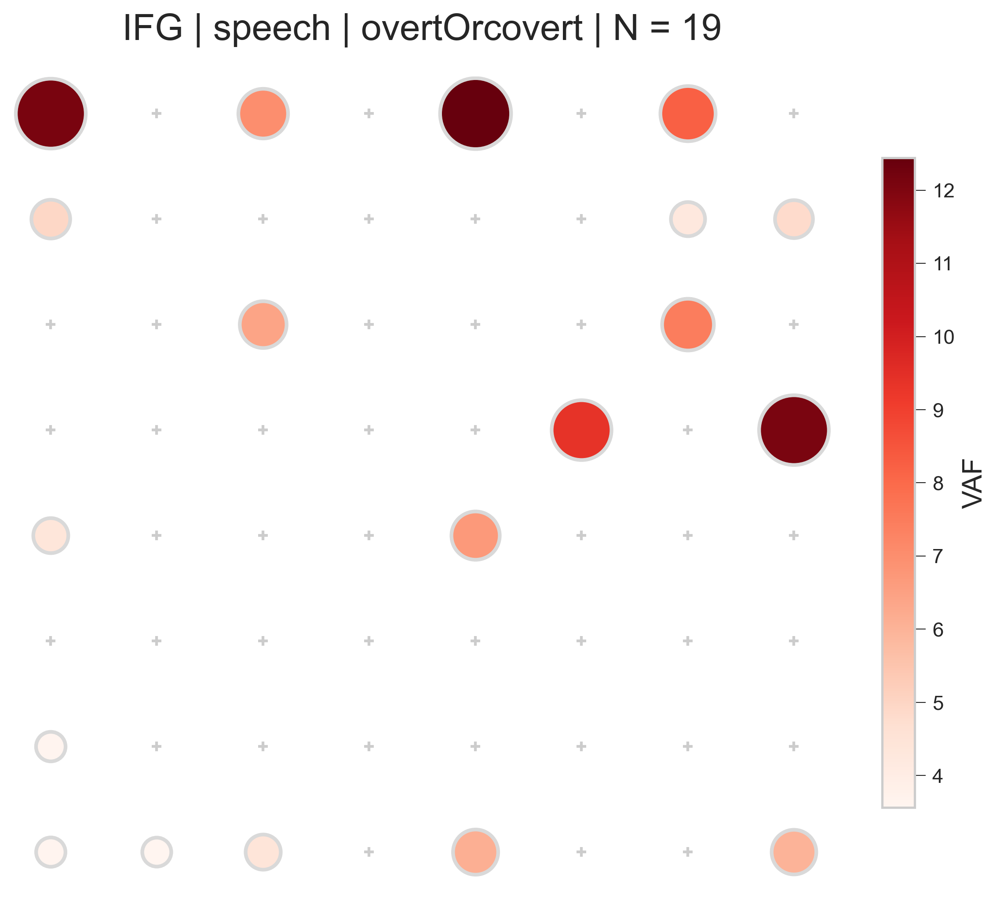

In [ ]:
brain_area       = "IFG" # AIP, IFG
task             = "speech" # cl_grasping, speech, concurrent
trial_label_type = "overtOrcovert" # graspType, handOpenOrClose, overtOrcovert
stride_len       = 10

neuralDataFrame  = neuralDataFrame_Dictionary[f'{brain_area}_{task}'].iloc[::stride_len, :]
time_vec_sec     = neuralDataFrame['Time'].unique()

# Maximum is T - stride_len, where T = trial length
time_epoch = "go" # options: cue, go, all
time_epoch = (800,2200) if time_epoch == "cue" else (2250,4700) if time_epoch == "go" else (time_vec_sec[0], time_vec_sec[-1])

weighted_individual = "weighted_individual"
VGTW_Out   = run_VGTW(
    neuralDataFrame,
    window_len          = 200,
    time_epoch          = time_epoch,
    weighting_technique = weighted_individual, # options: weighted_individual, weighted_global
    use_cross_validation= True, # True, False
    num_folds           = 5,
    trial_label_column  = trial_label_type
)

optimal_window_centers = VGTW_Out['optimal_window_centers']

center_indices = time_vec_sec[optimal_window_centers.astype(int)]
window_len     = 500

stride_len       = 1
neuralDataFrame  = neuralDataFrame_Dictionary[f'{brain_area}_{task}'].iloc[::stride_len, :]

feature_array, trial_labels = window_and_compute_feature_stat(neuralDataFrame, stat = "mean", center_indices = center_indices, window_len = window_len, trial_label_type = trial_label_type)

electrode_tuning_summary, mean_array_tuned_electrodes_only = compute_neural_tuning(feature_array, trial_labels, p_value_threshold=0.05)

title_params = {"brain_area": brain_area, "task": task, "label_type": trial_label_type}

plot_tuning_heatmap(electrode_tuning_summary, title_params = title_params, scale_by_size_TF = True)


### COMPUTE FEATURE STAT ON NEURAL SIGNALS

### RUN PCA (ON FEATURE STATS) AND GENERATE SCATTER PLOT

In [ ]:
center_indices   = time_vec_sec[optimal_window_centers.astype(int)]
window_len       = 250

stride_len       = 1
neuralDataFrame  = neuralDataFrame_Dictionary[f'{brain_area}_{task}'].iloc[::stride_len, :]

stat = ["mean"]
# stat = ["mean", "median", "max", "var", "std", "sum", "skewness", "kurtosis", "range"] # options: mean, median, max, var, std, sum, skewness, kurtosis, range

if len(stat)>1:
    # Scatter of neural features computated using different stat types for comparison
    feature_array = {}
    for stat_ in stat:
        feature_array_temp, trial_labels = window_and_compute_feature_stat(neuralDataFrame, stat = stat_, center_indices = center_indices, window_len = window_len,trial_label_type=trial_label_type)

        _, mean_array_tuned_electrodes_only = compute_neural_tuning(feature_array_temp, trial_labels, p_value_threshold=0.05)

        if mean_array_tuned_electrodes_only.shape[0]>=3:
            feature_array[stat_] = mean_array_tuned_electrodes_only
else:
    # Scatter plot of neural features based on 1 stat type
    feature_array, trial_labels = window_and_compute_feature_stat(neuralDataFrame, stat = stat[0], center_indices = center_indices, window_len = window_len,trial_label_type=trial_label_type)

    electrode_tuning_summary, mean_array_tuned_electrodes_only = compute_neural_tuning(feature_array, trial_labels, p_value_threshold=0.05)
    if mean_array_tuned_electrodes_only.shape[0]>=3:
        feature_array = mean_array_tuned_electrodes_only
    # feature_array = mean_array_tuned_electrodes_only

title_params = {"brain_area": brain_area, "task": task, "label_type": trial_label_type, "stat": stat}
run_pca_and_plot_scatter(feature_array, trial_labels = trial_labels, trial_label_type = trial_label_type, title_params = title_params, plot_kde_TF = True)


IndexError: index 412 is out of bounds for axis 0 with size 190

## NEURAL DECODING


#### PREPARE TRAINING DATA

In [ ]:

label_encoder = {}
for i,l in enumerate(np.unique(trial_labels)):
    label_encoder[l] = i

trial_labels_temp  = np.vectorize(label_encoder.get)(trial_labels)
feature_array_temp = feature_array.T

split_idxs = get_data_split_idxs (num_samples=feature_array_temp.shape[0], ratios=(75,25))

X_train      = feature_array_temp[split_idxs["train"],]
Y_train      = trial_labels_temp[split_idxs["train"]]
X_test       = feature_array_temp[split_idxs["test"],]
Y_test       = trial_labels_temp[split_idxs["test"]]

################################# DATA AUGMENTATION ###############################
augment_train_data_TF = False # False, True

if augment_train_data_TF:
    data_to_augment   = X_train
    labels_to_augment = Y_train
    cgan_params = {}
    gauss_params = {}
    gauss_params["dist_type"] = "univariate"
    # Perform combined augmentation
    augmented_data, augmented_labels = augment_training_data(data_to_augment, labels_to_augment, num_classes = len(np.unique(labels_to_augment)), augmentation_method="gaussian", num_new_samples_per_class=50, cgan_params=cgan_params, gauss_params = gauss_params)

    X_train = augmented_data
    Y_train = augmented_labels

    print("")
    print(f"Original train data shape: {data_to_augment.shape}")
    print(f"Augmented train data shape: {augmented_data.shape}")
    print(f"Original train labels shape: {labels_to_augment.shape}")
    print(f"Augmented train labels shape: {augmented_labels.shape}")

#### BUILD & TEST NEURAL DECODER

Fitting 5 folds for each of 40 candidates, totalling 200 fits

*------------------------------------------------------------*
Model: SVC(C=1, kernel='linear')
Model test accuracy: 69.44%

*------------------------------------------------------------*

Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.79      0.73        19
           1       0.71      0.59      0.65        17

    accuracy                           0.69        36
   macro avg       0.70      0.69      0.69        36
weighted avg       0.70      0.69      0.69        36



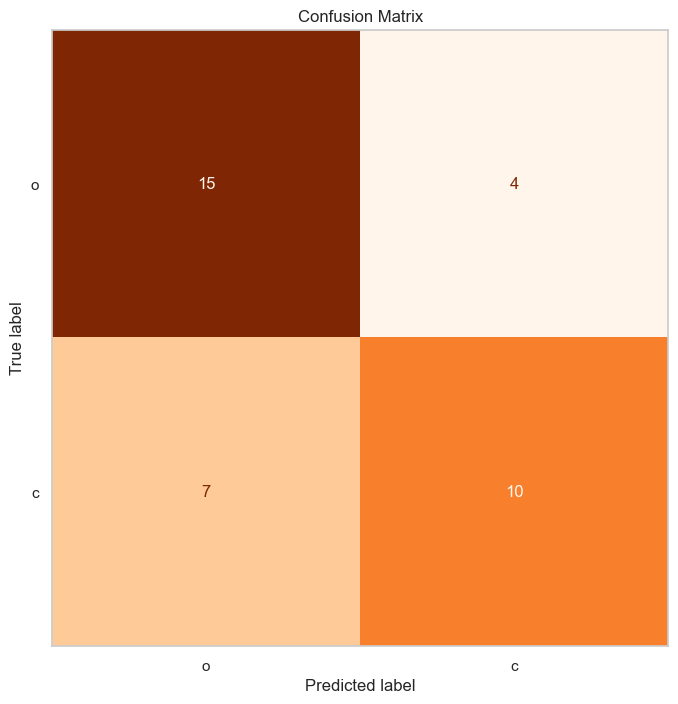

In [ ]:

from sklearn.metrics import classification_report, accuracy_score

# model options: ['logistic_regression', 'naive_bayes','random_forest', 'svm', 'knn', 'decision_tree']
decoder_output = fit_neural_decoder(X_train=X_train, y_train=Y_train, model_='svm', optimize_hyperparameters = True)

print("")
print("*------------------------------------------------------------*")
print(f"Model: {decoder_output['trained_model']}")

# Step 5: Evaluate on the test set
y_pred = decoder_output["trained_model"].predict(X_test)
acc    = accuracy_score(Y_test, y_pred)
test_report = classification_report(Y_test, y_pred)

# Metrics for evaluation
print(f"Model test accuracy: {100*acc:.2f}%")
print("")
print("*------------------------------------------------------------*")
print("\nClassification Report:\n", test_report)

# plot the confusion matrices for both classifiers
class_names        = ['o', 'c']

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(Y_test, y_pred)

fig, ax = plt.subplots(figsize=(8, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap="Oranges", ax=ax, colorbar=False)
disp.ax_.grid(False)
plt.title("Confusion Matrix")
plt.show()

## NEURAL DECODING...UNIFIED


PREP TRAINING DATA & FIT LINEAR MODELS

In [ ]:
subset_ = "tuned_any_task" # all, tuned_per_task, tuned_any_task

session_days = ["2024.11.08","2024.11.12","2024.12.02","2024.12.03","2024.12.05"]
# session_days = [session_days[-1]]

file_name_r = "feature_maps" # file to read
file_name_w = "decoder_output" # file to write to

d = 0
for session_day in session_days:

    ############ READ ############
    file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{session_day}'

    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)

    print("*---------------------- File Loaded Successfully! ---------------------*")
    print("*----------------------------------------------------------------------*")

    print(f"***Building Neural Decoders:  Day {d+1} of {len(session_days)}")

    decoder_output = fit_decoders_across_task_modalities(feature_maps["features"],electrode_subset_to_use=subset_)

    ############ WRITE ############
    print("*Saving Dictionary to file...")

    file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/{session_day}'

    write_pickle_dictionary(file_to_save = decoder_output, file_parent_directory = file_parent_directory, file_name_w = file_name_w)

    d+=1

# plot_cross_modality_metric_bars(decoder_output["decoding_accuracy"],"decoding_accuracy", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} )

PLOT MODEL OUTPUT (CLASSIFICATION ACCURACY)

In [ ]:
session_days = ["2024.11.08","2024.11.12","2024.12.02","2024.12.03","2024.12.05"]
session_days = session_days[:-1]

file_name_r = "decoder_output" # file to read

decoder_outputs_multi_session = []
d = 0
for session_day in session_days:

    ############ READ ############
    file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/{session_day}'

    decoder_output = read_pickle_dictionary(file_parent_directory, file_name_r)

    print("*---------------------- File Loaded Successfully! ---------------------*")
    print("*----------------------------------------------------------------------*")

    decoder_outputs_multi_session.append(decoder_output["decoding_accuracy"])

    d+=1

decoder_output_accuracy = concatenate_dicts(decoder_outputs_multi_session)

plot_cross_modality_metric_bars(decoder_output_accuracy,"decoding_accuracy", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} )
# plot_cross_modality_metric_bars(decoder_output["decoding_accuracy"],"decoding_accuracy", color_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} )

***Loading 'decoder_output' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/2024.11.08
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'decoder_output' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/2024.11.12
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'decoder_output' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/2024.12.02
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Loading 'decoder_output' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Results/decoder_output/2024.12.03
*---------

## GRASPNET

MODEL ARCHITECTURE

In [ ]:
# Binary Classification with Sonar Dataset: Standardized Smaller
import pandas as pd
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from scikeras.wrappers import KerasClassifier
from sklearn import model_selection
from sklearn import preprocessing
from sklearn.pipeline import Pipeline
import numpy as np

# load dataset
dataset = pd.read_csv("/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/connectionist+bench+sonar+mines+vs+rocks/sonar.all-data", header=None).values

# split into input (X) and output (Y) variables
X = dataset[:,0:60].astype(float)
Y = dataset[:,60]

# encode class values as integers
encoder   = preprocessing.LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)

num_classes  = np.unique(Y).size
num_features = X.shape[1]

def build_graspnet(num_features, num_classes, dropoutRate=.25):

    input_layer   = layers.Input(shape = num_features)
    input_layer   = layers.BatchNormalization()(input_layer)

    block1       = layers.Dense(units=30, name = 'hidden1')(input_layer)
    block1       = layers.BatchNormalization()(block1)
    block1       = layers.Activation('relu')(block1)
    block1       = layers.Dropout(dropoutRate)(block1)

    model_output = layers.Dense(units=num_classes, name = 'output_layer')(block1)
    model_output = layers.Activation('softmax', name = 'softmax')(model_output)

    model = Model(inputs=input_layer, outputs=model_output)

	# Compile model
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    return model

estimators = []
estimators.append(('standardize', preprocessing.StandardScaler()))
estimators.append(('mlp', KerasClassifier(model=build_graspnet(num_classes=num_classes,num_features=num_features), epochs=100, batch_size=5, verbose=0)))
pipeline = Pipeline(estimators)
kfold    = model_selection.StratifiedKFold(n_splits=10, shuffle=True)
results  = model_selection.cross_val_score(pipeline, X, encoded_Y, cv=kfold)

print(f"Accuracy: {results.mean()*100: .2f}% ({results.std()*100: .2f}%)")

AttributeError: module 'keras.saving' has no attribute 'get_custom_objects'

In [ ]:
# Binary Classification with Sonar Dataset: Standardized Smaller
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline


# load dataset
dataset = pd.read_csv("/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/connectionist+bench+sonar+mines+vs+rocks/sonar.all-data", header=None).values

# split into input (X) and output (Y) variables
X = dataset[:,0:60].astype(float)
Y = dataset[:,60]
# encode class values as integers
encoder = LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)
# smaller model
def create_smaller():
	# create model
	model = Sequential()
	model.add(Dense(30, input_shape=(60,), activation='relu'))
	model.add(Dense(1, activation='sigmoid'))
	# Compile model
	model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
	return model
estimators = []
estimators.append(('standardize', StandardScaler()))
estimators.append(('mlp', KerasClassifier(model=create_smaller, epochs=100, batch_size=5, verbose=0)))
pipeline = Pipeline(estimators)
kfold = StratifiedKFold(n_splits=10, shuffle=True)
results = cross_val_score(pipeline, X, encoded_Y, cv=kfold)
print("Smaller: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

2025-01-24 12:34:12.266329: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


ModuleNotFoundError: No module named 'tensorflow.keras'

PREP DATA FOR TRAINING

In [ ]:
from tensorflow.keras import utils as np_utils
import numpy as np

from tensorflow.keras.callbacks import ModelCheckpoint

# tools for plotting confusion matrices
from matplotlib import pyplot as plt

##################### Process, filter and epoch the data ######################
# extract raw data. scale by 1000 due to scaling sensitivity in deep learning
X = epochs.get_data()*1000 # format is in (trials, channels, samples)
y = labels

kernels, chans, samples = 1, 60, 151

# take 50/25/25 percent of the data to train/validate/test
X_train      = X[0:144,]
Y_train      = y[0:144]
X_validate   = X[144:216,]
Y_validate   = y[144:216]
X_test       = X[216:,]
Y_test       = y[216:]

# convert labels to one-hot encodings.
Y_train      = np_utils.to_categorical(Y_train-1)
Y_validate   = np_utils.to_categorical(Y_validate-1)
Y_test       = np_utils.to_categorical(Y_test-1)

# convert data to NHWC (trials, channels, samples, kernels) format. Data
# contains 60 channels and 151 time-points. Set the number of kernels to 1.
X_train      = X_train.reshape(X_train.shape[0], chans, samples, kernels)
X_validate   = X_validate.reshape(X_validate.shape[0], chans, samples, kernels)
X_test       = X_test.reshape(X_test.shape[0], chans, samples, kernels)

print('X_train shape:', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0], 'test samples')

In [ ]:
import tensorflow as tf


In [ ]:
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
...

TRAIN GRASPNET MODEL

In [ ]:

############################# EEGNet Model ##################################

# configure the EEGNet-8,2,16 model with kernel length of 32 samples (other
# model configurations may do better, but this is a good starting point)
eegnet_model = EEGModels.EEGNet(num_classes = 4, num_chans = chans, num_time_points = samples,
               dropoutRate = 0.5, kernel_len = 64, num_temporal_filters = 8, D = 2, total_num_spatial_filters = 16,
               dropoutType = 'Dropout')

# compile the model and set the optimizers
eegnet_model.compile(loss = 'categorical_crossentropy', optimizer = 'adam',
              metrics = ['accuracy'])

# set a valid path for your system to record model checkpoints
checkpointer = ModelCheckpoint(filepath = '/tmp/checkpoint.h5', verbose = 1,
                               save_best_only = True)

################################################################################
fittedModel = eegnet_model.fit(X_train, Y_train, batch_size = 64, epochs = 350,
                        verbose = 2, validation_data = (X_validate, Y_validate),
                        callbacks = [checkpointer])

# load optimal weights
eegnet_model.load_weights('/tmp/checkpoint.h5')

###############################################################################
# make prediction on test set.

# Use mode.evaluate instead??
probs       = eegnet_model.predict(X_test)
preds       = probs.argmax(axis = -1)
acc         = np.mean(preds == Y_test.argmax(axis=-1))
print(f"Test accuracy:{100*acc: .2f}%")



PLOT TUNING YIELD

In [ ]:
fig, axes = plt.subplots(1,2,sharex=True,figsize=(18,10),dpi=1000)
axes = axes.flatten()

ax_color = "indigo" #indigo,darkslateblue
tick_n_label_font = 45
title_font = 55
c_palette = {"cl_grasping":"#9027D3","speech":"#EF8E3B"} # s: F2D27A,
tuning_quality_dict = feature_maps["tuning_yield"]
for a,brain_area in enumerate(tuning_yield_dict.keys()):
    ax = axes[a]
    tuning_yield_df = tuning_yield_dict[brain_area]
    bar_plot = sns.barplot(data=tuning_yield_df, x= "task_modality", y="yield", hue="task",  gap=.2, palette=c_palette, fill=True, log_scale = False, linewidth=4.5, width = .5, ax=ax,saturation=1)

    # Extract the colors used in the palette
    # palette = sns.color_palette('viridis')
    palette=c_palette
    hue_colors = dict(zip(tuning_yield_df['task'].unique(), palette))  # Map hue to colors

    from matplotlib.collections import PolyCollection, LineCollection

    ax.grid(False)
    ax.set_xlabel("Task Modality",fontsize=tick_n_label_font, labelpad=50, c=ax_color)  # Set x-axis label font size
    ax.set_title(f"{brain_area}",fontsize=tick_n_label_font, pad=30, c=ax_color)  # Set x-axis label font size
    ax.set_ylim(bottom=10e-3,top=10e1)
    ax.tick_params(axis='both', which='major', labelsize=tick_n_label_font, colors=ax_color)
    ax.legend(fontsize=round(.7*tick_n_label_font))

    if a>0:
        ax.tick_params(axis='y', left=False, labelleft=False)  # Remove y-axis ticks and labels
        ax.set_ylabel("")  # Set x-axis label
    else:
        ax.set_ylabel("Yield", fontsize=tick_n_label_font, labelpad=30, c=ax_color)  # Set x-axis label font size
        from matplotlib.ticker import PercentFormatter
        ax.yaxis.set_major_formatter(PercentFormatter(xmax=100))

    bar_plot.spines[['top','right','bottom','left']].set_visible(False)  # Turn off specified spines

    face_alphas = {
    'separate': 0.3,  # Opacity for separate
    'concurrent': 0.05   # Opacity for concurrent
    }
    edge_linewidths = {
    'separate': 2,  # Opacity for separate
    'concurrent': 3.5   # Opacity for concurrent
    }
    line_styles = {
    'separate': "-",  # Opacity for separate
    'concurrent': "-"   # Opacity for concurrent
    }

    unique_tasks = tuning_yield_df['task'].unique()
    unique_modalities = tuning_yield_df['task_modality'].unique()
    # Access all the drawn patches (bars)
    patches = bar_plot.patches

    # Cycle through each combination of (task, modality)
    idx = 0
    for task in unique_tasks:
        for modality in unique_modalities:
            # The current bar patch
            patch = patches[idx]
            idx += 1

            face_color = to_rgba(c_palette[task], alpha=face_alphas[modality])  # Semi-transparent face
            edge_color = to_rgba(c_palette[task], alpha=1.0)  # Full opacity for edge color

            patch.set_facecolor(face_color)  # Set face color with alpha
            patch.set_edgecolor(edge_color)  # Set edge color with full opacity

            patch.set_linewidth(edge_linewidths[modality])           # Set edge line width
            patch.set_linestyle(line_styles[modality])

plt.suptitle("Tuning Yield", fontsize=title_font, c=ax_color, y = 1.05)
plt.tight_layout()
# plt.savefig('plot.png', dpi=750)
plt.show()


### COMPUTE AND PLOT FTV DISTRIBUTION

In [ ]:
subset_ = "tuned_any_task" # all, tuned_per_task, tuned_any_task

session_days  = ["2024.11.08","2024.11.12","2024.12.02","2024.12.03","2024.12.05"]
session_days  = session_days[:-1]

file_name_r   = "feature_maps" # file to read

win_technique = "weighted_individual" # weighted_individual, weighted_global
win_len       = 400 # 150, 400, 650

ftv_multi_session = []

d = 0
for session_day in session_days:

    ############ READ ############
    # file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{session_day}'
    file_parent_directory = f'/Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/{win_technique}/win_len_{win_len}/{session_day}'


    feature_maps = read_pickle_dictionary(file_parent_directory, file_name_r)

    print("*---------------------- File Loaded Successfully! ---------------------*")
    print("*----------------------------------------------------------------------*")

    print(f"***Computing Fractional Task Variance:  Day {d+1} of {len(session_days)}")

    neural_feature_dict = feature_maps["features"]

    ftv = compute_ftv_across_task_modalities(neural_feature_dict, electrode_subset_to_use=subset_,brain_areas = ["AIP","IFG"],
        task_modalities = ['separate', 'concurrent'],
        task_list  = ["cl_grasping" , "speech"])

    ftv_multi_session.append(ftv)

    d+=1


def concatenate_nested_dicts(dict_list):
    """
    Concatenate multiple dictionaries with the same keys,
    where the values are dictionaries of arrays.

    Args:
        dict_list (list): List of dictionaries to concatenate.

    Returns:
        dict: A dictionary with the same keys, where the values are
              dictionaries with concatenated arrays.

    Date: 01.16.2025.Th
    Author: CXF & the AI Assistant
    """

    import numpy as np
    # Ensure all dictionaries have the same top-level keys
    if not all(set(d.keys()) == set(dict_list[0].keys()) for d in dict_list):
        raise ValueError("All dictionaries must have the same top-level keys.")

    # Ensure all nested dictionaries have the same sub-keys
    for key in dict_list[0].keys():
        if not all(set(d[key].keys()) == set(dict_list[0][key].keys()) for d in dict_list):
            raise ValueError(f"All nested dictionaries under key '{key}' must have the same sub-keys.")

    # Concatenate the arrays for each sub-key under each top-level key
    concatenated_dict = {
        key: {
            sub_key: np.concatenate([d[key][sub_key] for d in dict_list], axis=0)
            for sub_key in dict_list[0][key].keys()
        }
        for key in dict_list[0].keys()
    }
    return concatenated_dict


ftv_multi_session = concatenate_nested_dicts(ftv_multi_session)

plot_ftv_distribution(ftv_multi_session, num_bins = 15, histtype = "bar", opacity=.5, brain_areas = ["AIP","IFG"], task_modalities=["separate","concurrent"], color_palette = {"cl_grasping":"#9300D7","speech":"#F9B900"})



***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_400/2024.11.08
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Computing Fractional Task Variance:  Day 1 of 4
***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_400/2024.11.12
*---------------------- File Loaded Successfully! ---------------------*
*----------------------------------------------------------------------*
***Computing Fractional Task Variance:  Day 2 of 4
***Loading 'feature_maps' from /Users/Crispin/Desktop/LIMBS/Python/Multi-task Representation Analysis/Data/feature_maps/weighted_individual/win_len_400/2024.12.02
*---------------------- File Loaded Successfully! ---------------------*
*-------------------------------------------

In [ ]:

plot_ftv_pie(ftv_multi_session, opacities=(1,.4), brain_areas = ["AIP","IFG"], task_modalities=["separate","concurrent"])


### SUBSPACE OVERLAP ANALYSIS

In [ ]:
import numpy as np
from sklearn.decomposition import PCA

def compute_subspace_alignment(data_all_tasks, subspace_dim):
    """
    Computes the subspace alignment index matrix between multiple tasks.

    Parameters:
    ----------
    data_all_tasks : list of ndarray
        A list where each element is an ndarray of neural data for a task.
        Each ndarray should have shape (channels, trials).
    subspace_dim : int
        The dimensionality of the subspace to consider (number of top principal components).

    Returns:
    -------
    alignment_index_matrix : ndarray
        A matrix of alignment indices where element (i, j) represents the alignment index
        between task i and task j.

    Data: 01.13.2025.M
    Authors: CXF & the AI Assistant
    """
    num_tasks = len(data_all_tasks)  # Number of tasks
    alignment_index_matrix = np.zeros((num_tasks, num_tasks))  # Initialize result matrix

    for ci in range(num_tasks):
        data_task_a = data_all_tasks[ci]  # Data for Task A
        cov_task_a = np.cov(data_task_a)  # Covariance matrix of Task A
        var_task_a = np.linalg.svd(cov_task_a, compute_uv=False)  # Singular values of Task A (variance explained)

        for cj in range(num_tasks):
            data_task_b = data_all_tasks[cj]  # Data for Task B
            # Compute PCA for Task B and extract top PCs
            pca_task_b = PCA(n_components=subspace_dim)
            pca_task_b.fit(data_task_b.T)  # Transpose for sklearn's PCA (trials x channels)
            pc_weights_task_b = pca_task_b.components_.T  # Principal components (channels x subspace_dim)

            # Compute the variance of Task A explained by Task B's top PCs
            expl_var_between_tasks = np.trace(pc_weights_task_b.T @ cov_task_a @ pc_weights_task_b)

            # Compute the variance of Task A explained by its own top PCs
            expl_var_within_task_a = np.sum(var_task_a[:subspace_dim])

            # Compute the alignment index
            alignment_index_matrix[ci, cj] = expl_var_between_tasks / expl_var_within_task_a

    return alignment_index_matrix


### SAVE DATA TO CSV

In [ ]:
import pandas as pd
import os

session_day = "2024.10.16"
brain_area  = "IFG"
task        = "CL_Grasping"

directory = f"/Users/Crispin/Desktop/LIMBS/MATLAB/G-causal-analysis/Simulations/Speech & \
Grasp Data_trialmats/{session_day}/{brain_area}/{task}".strip()

# Specify the directory and file name
filename = "neuralDataFrame.csv"

# Ensure the directory exists (optional, if you're creating a new directory)
os.makedirs(directory, exist_ok=True)

# Save the file
file_path = os.path.join(directory, filename)

stride_len = 50
neuralDataFrame_downsampled = neuralDataFrame.iloc[::stride_len, :]
neuralDataFrame_downsampled.to_csv(file_path, index=False)
